# Homework set 3

(Due Mar 3., 2023 at Noon)

Submit your solution notebook in your directory via github PR.

## Problem 1 (100 pts)

Our Colloquium speaker a couple of weeks ago, Ashley Villar, has had to use MCMC extensively. She had something like 5,243 objects from Pan-STARRS to analyze after all (https://zenodo.org/record/3974950)

You'll only have to deal with two - the two that are in this directory

In [1]:
!ls *snana.dat

PS1_PS1MD_PSc000098.snana.dat PS1_PS1MD_PSc000174.snana.dat


She used equation 1, defined here: https://arxiv.org/abs/1905.07422

# $ F= \begin{cases}\frac{A+\beta\left(t-t_0\right)}{1+e^{-\left(t-t_0\right) / \tau_{\text {rise }}}} & t<t_1 \\ \frac{\left(A+\beta\left(t_1-t_0\right)\right) e^{-\left(t-t_1\right) / \tau_{\text {fall }}}}{1+e^{-\left(t-t_0\right) / \tau_{\text {rise }}}} & t \geq t_1\end{cases} $

to model the *flux*, $F$, of a supernova in some band, at times, $t$.

You can see the fits Ashley derived here:

<img src="examples.jpg">

As Bayesian's we have 4 questions to answer

    What's the model?
    What's the Likelihood?
    What's the Prior?
    How do you sample?

I've tell you 1 (eqn. 1 in Villar). and you've already guessed 4 (use `emcee`: https://emcee.readthedocs.io/en/stable/). 

Write some functions to implement the model, likelihood and priors, and use `emcee` to sample the posterior with 20 walkers and however many steps you feel is necessary for the burn-in and chain. (50 pts - 15 each for the model, likelihood, priors and 5 to sample) 
 
Show that the posterior is reasonable by generating a corner plot with the `corner` package. (10 pts)

Get the median estimate for each parameter, and recreate the plot above from Ashley. Note that she's made 5 random draws from the chain for each passband to give the reader a sense for the uncertainties. (25 pts)

Report the auto-correlation length of your chain. Thin it by a factor of 10 and report the auto-correlation length again. (15 pts)

### Write some functions to implement the model, likelihood and priors, and use emcee to sample the posterior with 20 walkers and however many steps you feel is necessary for the burn-in and chain. (50 pts - 15 each for the model, likelihood, priors and 5 to sample)

I choose to use a Gaussian log likelihood,
\begin{equation}
\ln L = \text{const.} - \sum_{i=1}^{N} \frac{\left(F(t_i)^{obs} - F(t_i)^{model}\right)^2}{2\sigma(t_i)^2}
\end{equation}

Since Bayes' theorem states that the posterior is the product of the likelihood and the prior (divided by the evidence), the log of the posterior is proportional to the sum of the log likelihood and the log prior.

\begin{equation}
P(\theta | D) = \frac{P(D|\theta) P(\theta)}{P(D)}
\end{equation}
so
\begin{equation}
\log P(\theta | D) \propto \log(P(D|\theta)) + \log(P(\theta))
\end{equation}

Villar et al. 2019 use the following priors, where $U(a, b)$ is the uniform distribution between $a$ and $b$, and $N(\hat{x}, \sigma)$ is the normal distribution with mean $\hat{x}$ and standard deviation $\sigma$:

| Parameter | Units | <div style="width:200px">Prior</div>|
| --------- | ----------- |------------------- |
|$\tau_{rise}$|days|$U(0.01, 50)$|
|$\tau_{fall}$|days|$U(1, 300)$|
|$t_{0}$|MJD|$U(t_{min} - 50, t_{max} + 300)$|
|$A$|flux|$U(3\sigma, 100F_{max})$|
|$\beta$|flux/day|$U(-F_{max}/150, 0)$|
|$\gamma \equiv t_1 - t_0$|days|$(2/3)N(5, 5) + (1/3)N(60, 30)$|


Following Villar et al. 2019, we can reparameterize using $\gamma \equiv t_1 - t_0$ so the model becomes: 
# $ F= \begin{cases}
\frac{A+\beta\left(t-t_0\right)}{1+e^{-\left(t-t_0\right) / \tau_{\text {rise }}}} & t < \gamma + t_0 \\ \frac{\left(A+\beta\left(\gamma\right)\right) e^{-\left(t-\gamma - t_0\right) / \tau_{\text {fall }}}}{1+e^{-\left(t-t_0\right) / \tau_{\text {rise }}}} & t \geq \gamma + t_0
\end{cases} $

Let's try to make even more informed choices on the priors by inspecting first how the model changes while changing only one parameter, and next by making guesses on the parameters that match the data for each light curve.

In [2]:
# Suppress warnings since we will get a lot when we .run_mcmc
import warnings
warnings.filterwarnings("ignore")
import numpy as np
import matplotlib.pyplot as plt
import emcee
from corner import corner
from astropy.table import Table
from scipy import stats as st
from multiprocessing import Pool, cpu_count
import matplotlib as mpl
import scipy.optimize as so

In [3]:
# Implement the model
def flux(t, A, beta, t_0, gamma, tau_rise, tau_fall): 
    t_1 = gamma + t_0
    flux_return = np.zeros_like(t) 
    msk1 = np.where(t < t_1)
    msk2 = np.where(t >= t_1)
    flux_return[msk1] = (A+beta*(t[msk1] - t_0)) / (1. + np.exp(-(t[msk1]-t_0)/tau_rise))
    flux_return[msk2] = (A+beta*(t_1-t_0))*np.exp(-(t[msk2] - t_1)/tau_fall) / (1. + np.exp(-(t[msk2]-t_0)/tau_rise))
    return flux_return

Let's look at band z in PS1_PS1MD_PSc000098.snana.dat

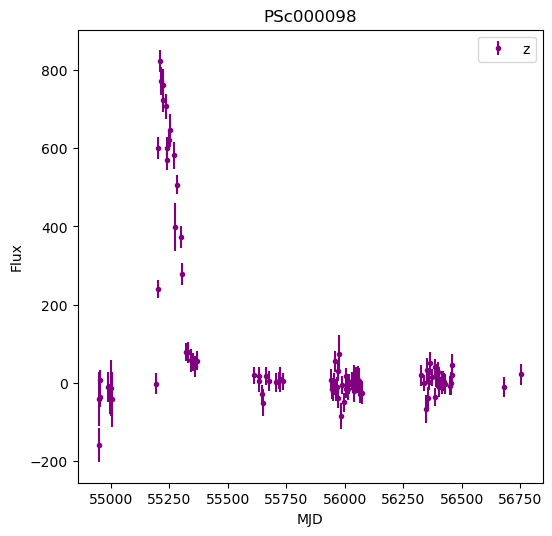

In [4]:
for sn_lc in ['PS1_PS1MD_PSc000098.snana.dat']:
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    for filt in ['z']:
        filt_mask = np.where(t['FLT'] == filt)
        current_model_time = t['MJD'][filt_mask]
        current_model_flux = t['FLUXCAL'][filt_mask]
        current_model_err = t['FLUXCALERR'][filt_mask] 
        plt.figure(figsize=(6,6),dpi=100)
        plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                        yerr=current_model_err,label=filt,c='purple')
        plt.xlabel('MJD')
        plt.ylabel('Flux')
        plt.title(sn_lc[10:-10])
        plt.legend()
        plt.show()

Visually, we can guess that $t_0$ (time of onset) is roughly 55250, and A (not quite peak flux but fairly close) is probably ballpark 800. We'll just sample from the priors listed in the paper as guesses in scipy's optimization for the other parameters.

      fun: 0.2701098623254239
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>
      jac: array([-1.88737764e-07, -1.41553436e-06,  5.27505444e-07, -4.99600675e-07,
        2.14273045e-06, -1.72084555e-07])
  message: 'CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL'
     nfev: 308
      nit: 36
     njev: 44
   status: 0
  success: True
        x: array([ 8.20212904e+02, -4.25389420e+00,  5.52009768e+04,  9.45088818e+01,
        1.52037717e+00,  2.10075466e+01])


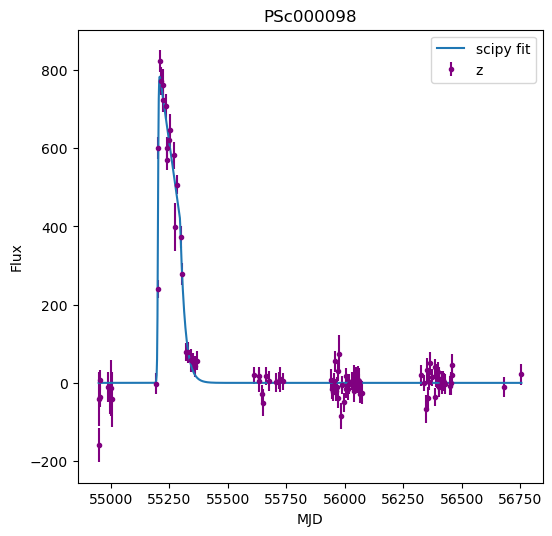

In [5]:
# Define reduced chi2 so that we can use scipy.optimize.minimize
def chisq(x, *args):
    A, beta, t_0, gamma, tau_rise, tau_fall = x
    time_arr, flux_arr, err_arr = args
    mod = flux(time_arr, A, beta, t_0, gamma, tau_rise, tau_fall)
    chisq = np.sum(((flux_arr - mod)**2.)/(err_arr**2.))/(len(t) - 6)
    return chisq 

current_sigma = np.mean(current_model_err)
current_Fmax = np.max(current_model_flux)
current_tmin = np.min(current_model_time)
current_tmax = np.max(current_model_time)

# set some bounds on each parameter
bounds = [(3.*current_sigma+1, 10.*current_Fmax - 1),
                      (-current_Fmax/150. + 0.1, -0.1),
                      (current_tmin - 49., current_tmax + 299.),
                      (0.5, 149.),
                      (0.02, 49.),
                      (1.5, 299.)]
guess = (800,-1,55200,100,2,30)
res = so.minimize(chisq, guess, args=(current_model_time, 
                                      current_model_flux, 
                                      current_model_err), 
                  bounds=bounds)
print(res)

plt.figure(figsize=(6,6),dpi=100)
plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                yerr=current_model_err,label=filt,c='purple')
model_time = np.linspace(np.min(current_model_time), np.max(current_model_time), 1000)
plt.plot(model_time, flux(model_time, *res.x),label='scipy fit')
plt.xlabel('MJD')
plt.ylabel('Flux')
plt.title(sn_lc[10:-10])
plt.legend()
plt.show()

Scipy did an ok good job of making a reasonable looking fit. It gives the following parameters:

In [6]:
print('fit(A, beta, t_0, gamma, tau_rise, tau_fall) ='+\
      ' ({:1.3f}, {:2.3f}, {:3.3f}, {:4.3f}, {:5.3f}, {:6.3f})'.format(*res.x))

fit(A, beta, t_0, gamma, tau_rise, tau_fall) = (820.213, -4.254, 55200.977, 94.509, 1.520, 21.008)


Next, let's explore how the model changes in parameter space:

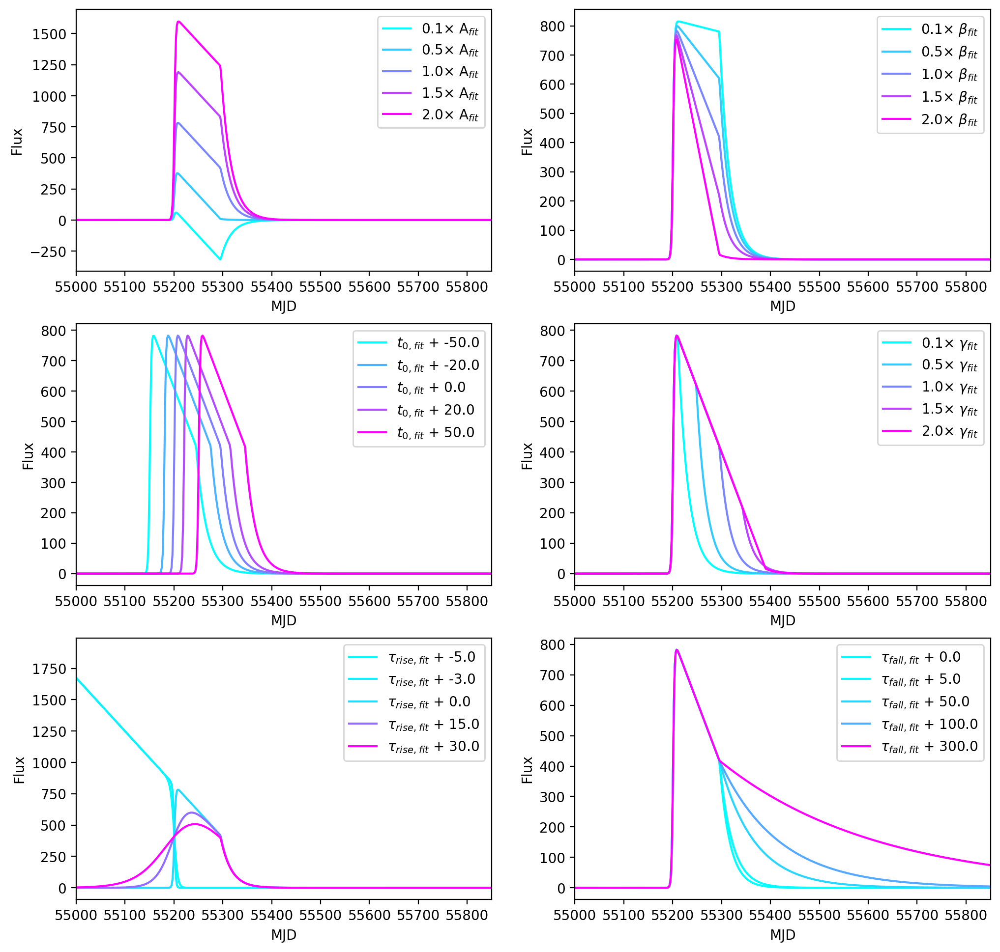

In [7]:
plt.figure(figsize=(12, 12), dpi=200)
scales = [0.1, 0.5, 1, 1.5, 2.0]
norm = mpl.colors.Normalize(vmin=min(scales), vmax=max(scales))
for enum, which_param in enumerate(['A', r'$\beta$', r'$t_{0,}$',r'$\gamma$', r'$\tau_{rise,}$', r'$\tau_{fall,}$']):
    plt.subplot(3,2,enum+1)
    if enum in [0, 1, 3]:
        for scale in scales:
            res_x_scale = res.x.copy()
            res_x_scale[enum] *= scale
            plt.plot(model_time, flux(model_time, *res_x_scale),
                    c=mpl.cm.cool(norm(scale)), label='{:.1f}'.format(scale)+r'$\times$ '+which_param+r'$_{fit}$')
    else:
        if enum == 2:
            offsets = [-50, -20, 0, 20, 50]
            norm_offset = mpl.colors.Normalize(vmin=min(offsets), vmax=max(offsets))
        elif enum == 4:
            offsets = [-5, -3, 0, 15, 30]
            norm_offset = mpl.colors.Normalize(vmin=min(offsets), vmax=max(offsets))
        elif enum == 5:
            offsets = [0, 5, 50, 100, 300]
            norm_offset = mpl.colors.Normalize(vmin=min(offsets), vmax=max(offsets))
        for offset in offsets:
            res_x_scale = res.x.copy()
            res_x_scale[enum] += offset
            plt.plot(model_time, flux(model_time, *res_x_scale),
                    c=mpl.cm.cool(norm_offset(offset)), label=which_param+r'$_{fit}$ + '+'{:.1f}'.format(offset))
        
    plt.ylabel('Flux')
    plt.xlabel('MJD')
    plt.legend()
    plt.xlim(55000, 55850)

Above, I am taking a subset in time of the data to zoom-in on the parts of the light curve that show clear changes in time. In each panel, all of the model parameters are the same as the fit from scipy, except for one. The legend shows which curves represent which changes in that parameter. Varying A, it is clear that A controls the amplitude of the model. This plot has parts of the light curve with negative flux (unphysical), due to too low A. Since A is pretty close to the peak flux of the light curve and from inspection we do not it to be too low lest it give an unphysical model, I modify the prior on A to be a Gaussian centered on the peak flux with with $0.25 F_{max}$. I choose this fairly wide distribution since A is not quite the peak flux. I set the prior to 0 outside of the range [3$\sigma$, 10$F_{max}$] so that we do not get totally physically-uninformed models. The lower limit corresponds to a 3$\sigma$ detection of a transient and the upper limit represents the closeness of the model parameter A to the peak flux.

\begin{equation}
P(A) = \begin{cases}
N(F_{max}, 0.25F_{max}) & \text{ if }10F_{max}{ > A > 3}\sigma \\
0 & \text{ otherwise}
\end{cases}
\end{equation}

$\beta$ changes the rate at which the flux decreases from its peak value. I keep the prior on $\beta$ described in the paper. We definitely don't want a model that has $\beta > 0$.

\begin{equation}
P(\beta) = U(-F_{max}/150, 0)
\end{equation}

From varying $t_0$, it is clear that $t_0$ is closely related to the time of peak flux. I choose to use a Gaussian prior centered on the fit to $t_0$ found from scipy, using a fairly narrow width of 25 days. I also impose new bounds

\begin{equation}
P(t_0) = \begin{cases}
N(t_{0, scipy fit}, 25) & \text{ if }t_{0, scipy fit} + 50{ > t_0 > }t_{0, scipy fit} - 50 \\
0 & \text{ otherwise}
\end{cases}
\end{equation}

$\gamma$ is the plateau duration. In the paper, a bimodal prior is chosen to represent supernovae with and without pateaus (former: SN IIP, latter: others). Each normal distribution is weighted differently, the plateau-less component of the prior is weighted twice that of the other component. This is probably informed by the population of the full sample. Since we are not dealing with the full sample of supernovae, but rather only two, we are in the realm of small number statistics, and a more representative prior would be to weight each type of supernova equally. I again impose bounds so that $\gamma$ is positive (it has units of days). I chose to impose another constraint on the prior of $\gamma$: that it does not exceed 150 days (mean of 60 days plus 3 half-widths of 30 days). This will help the walkers not wander off into parameter space that does not well-characterize the data even if the prior is non-zero.

\begin{equation}
P(\gamma) = \begin{cases}
\frac{1}{2}N(5, 5) + \frac{1}{2} N(60, 30) & \text{ if } 150 > \gamma > 0 \\
0 & \text{ otherwise}
\end{cases}
\end{equation}

$\tau_{rise}$ and $\tau_{fall}$ set the time it takes for the model to reach its peak flux and the timescale at which it declines after the plateau duration, respectively. It's not immediately clear how to build more informed priors than the ones listed in the paper. I do not show them here but parameters outside the given priors make the model have behavior that does not match the data, e.g. $\tau_{fall}$ less than 1 results in models that do not show the peak and decline that we expect from a supernova. 

\begin{equation}
P(\tau_{rise}) = U(0.01, 50) \\
P(\tau_{fall}) = U(1, 300)
\end{equation}

Since we will use the log priors, it is useful to recall that $\ln(0) = -\infty$ and $\ln(1) = 0$.

In [8]:
def gaussian(x, mu, sig):
    return 1./(np.sqrt(2.*np.pi)*sig)*np.exp(-np.power((x - mu)/sig, 2.)/2)


# Implement the model
def flux(t, A, beta, t_0, gamma, tau_rise, tau_fall): 
    t_1 = gamma + t_0
    flux_return = np.zeros_like(t) 
    msk1 = np.where(t < t_1)
    msk2 = np.where(t >= t_1)
    flux_return[msk1] = (A+beta*(t[msk1] - t_0)) / (1. + np.exp(-(t[msk1]-t_0)/tau_rise))
    flux_return[msk2] = (A+beta*(t_1-t_0))*np.exp(-(t[msk2] - t_1)/tau_fall) / (1. + np.exp(-(t[msk2]-t_0)/tau_rise))
    return flux_return
# Implement the likelihood
def log_likelihood(time, flux_obs, flux_err, A, beta, t_0, gamma, tau_rise, tau_fall):
    diff = flux_obs - flux(time, A, beta, t_0, gamma, tau_rise, tau_fall)
    log_like = -np.sum((diff**2)/(2.*flux_err**2))
    if np.isfinite(log_like):
        return log_like
    else:
        return -np.inf
# Implement the priors
def prior(time, flux_obs, flux_err, t_0_prior_val, A, beta, t_0, gamma, tau_rise, tau_fall):
    Fmax = np.max(flux_obs)
    sigma = np.mean(flux_err)
    t_min = np.min(time)
    t_max = np.max(time)   
    # prior on A:
    if (A <= 3.*sigma) or (A >= 10.*Fmax):
        return -np.inf
    p_A = gaussian(A, Fmax, 0.25*Fmax)
    # prior on beta:
    if (beta <= -Fmax/150.) or (beta >= 0.):
        return -np.inf
    p_beta = 1.
    # prior on t_0:
    if (t_0 <= t_0_prior_val - 50.) or (t_0 >= t_0_prior_val + 50.):
        return -np.inf
    p_t_0 = gaussian(t_0, t_0_prior_val, 25)
    # prior on gamma
    if (gamma <= 0.) or (gamma >= 150.):
        return -np.inf
    p_gamma = 0.5 * gaussian(gamma, 5, 5) + 0.5 * gaussian(gamma, 60, 30)
    # prior on tau_rise
    if (tau_rise <= 0.01) or (tau_rise >= 50.):
        return -np.inf
    p_tau_rise = 1.
    # prior on tau_fall
    if (tau_fall <= 1.) or (tau_fall >= 300.):
        return -np.inf
    p_tau_fall = 1.
    logprior = np.log(p_A*p_beta*p_t_0*p_gamma*p_tau_rise*p_tau_fall)
    return logprior

# Define the posterior: log(posterior) = log(likelihood) + log(prior)        
def log_posterior(params, *args):
    A, beta, t_0, gamma, tau_rise, tau_fall = params
    time, flux_obs, flux_err, t_0_prior_val = args
    Fmax = np.max(flux_obs)
    t_min = np.min(time)
    t_max = np.max(time)
    sigma = np.mean(flux_err) 
    t_fmax = time[flux_obs == np.max(flux_obs)][0]

    log_post = log_likelihood(time, flux_obs, flux_err,  A, beta, t_0, gamma, tau_rise, tau_fall) +\
           prior(time, flux_obs, flux_err,  t_0_prior_val, A, beta, t_0, gamma, tau_rise, tau_fall)
    if np.isfinite(log_post):
        return log_post
    else:
        return -np.inf

Now that we've implemented everything and gone over a test case to get initial guesses for our MCMC, let's display all the data and make the same guesses for each band in both supernovae

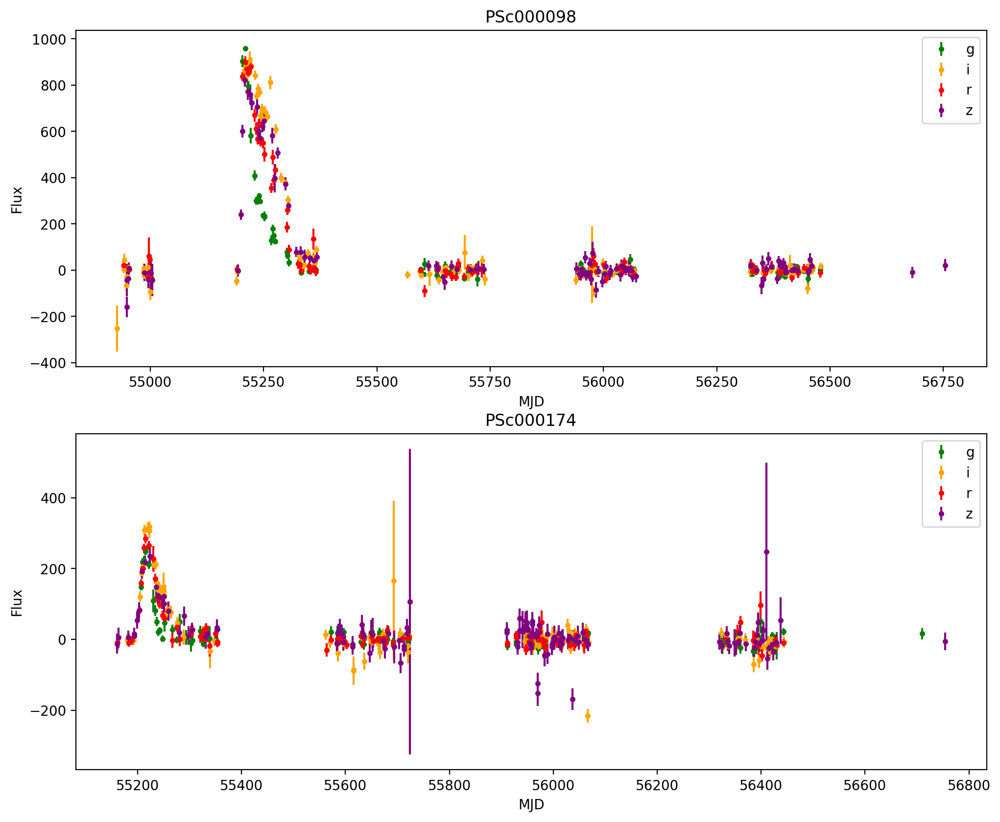

In [9]:
plt.figure(figsize=(12, 10), dpi=200)
xlims = [[55150, 55400],[55140, 55375]]
filt_colors = ['', 'green', 'orange', 'red', 'purple']
for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    plt.subplot(2,1,enum+1)
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                    yerr=current_model_err, label=filt, c=filt_colors[filt_enum])
    plt.xlabel('MJD')
    plt.ylabel('Flux')
    plt.title(sn_lc[10:-10])
    plt.legend()
plt.show()

Let's take a closer look around the time of peak flux to get a better grasp on the relevant model parameters:

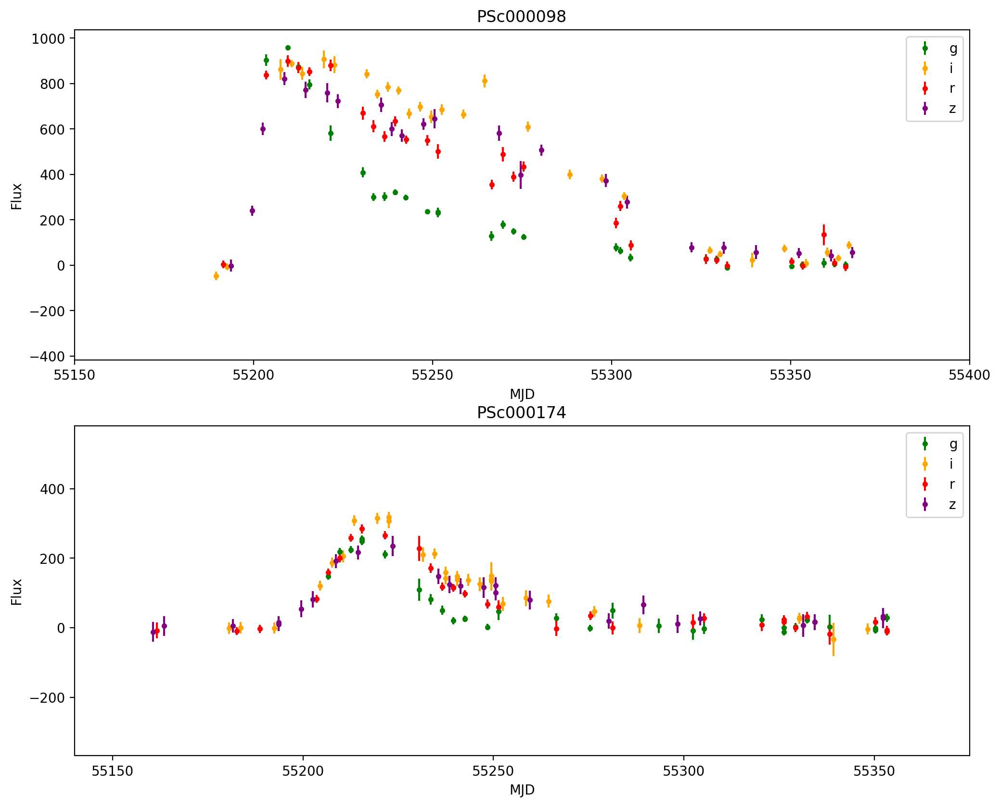

In [10]:
plt.figure(figsize=(12, 10), dpi=200)
xlims = [[55150, 55400],[55140, 55375]]
filt_colors = ['', 'green', 'orange', 'red', 'purple']
for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    plt.subplot(2,1,enum+1)
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                    yerr=current_model_err, label=filt, c=filt_colors[filt_enum])
    plt.xlabel('MJD')
    plt.ylabel('Flux')
    plt.title(sn_lc[10:-10])
    plt.xlim(xlims[enum])
    plt.legend()
plt.show()

In [11]:
guesses = [(900,-1,55200,100,2,30), #0098 g
          (900,-1,55200,100,2,30), #0098 i
          (900,-1,55200,100,2,30), #0098 r
          (900,-1,55200,100,2,30), #0098 z
          (300,-1,55225,20,15,30), #0174 g
          (300,-1,55225,20,15,30), #0174 i
          (300,-1,55225,20,15,30), #0174 r
          (300,-1,55225,20,15,30)] #0174 z

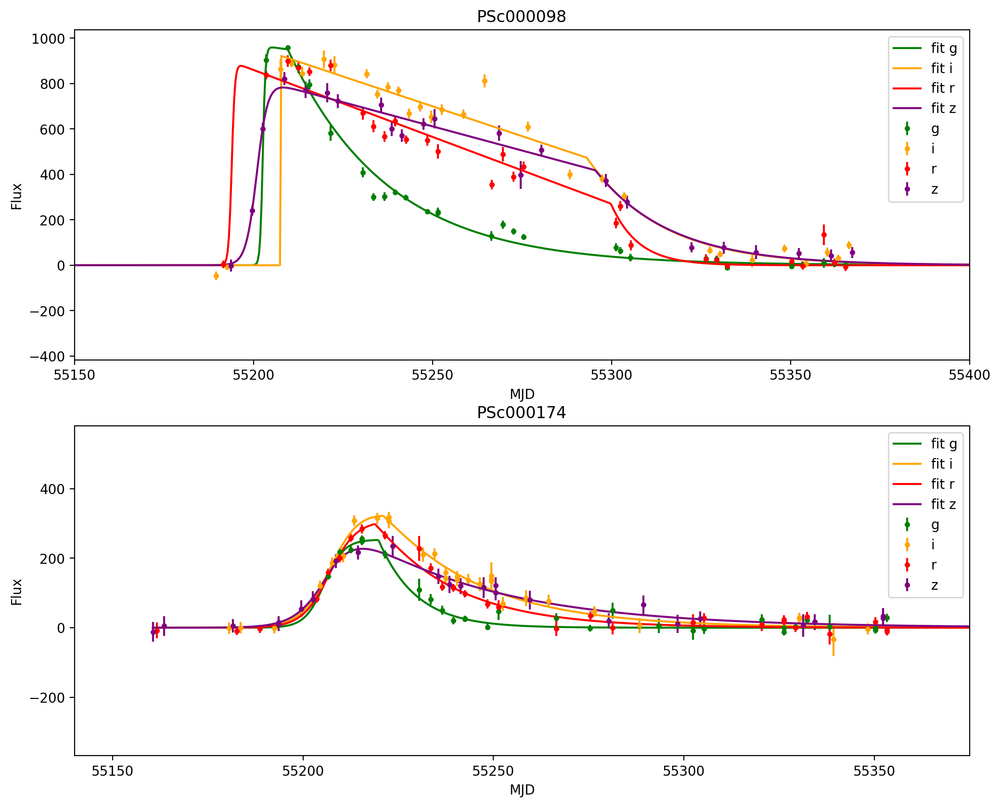

In [12]:
plt.figure(figsize=(12, 10), dpi=200)
xlims = [[55150, 55400],[55140, 55375]]
guess_enum = 0

optimized_guesses = np.ones((8, 6))

for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    plt.subplot(2,1,enum+1)
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                    yerr=current_model_err, label=filt, c=filt_colors[filt_enum])
            
            current_sigma = np.mean(current_model_err)
            current_Fmax = np.max(current_model_flux)
            current_tmin = np.min(current_model_time)
            current_tmax = np.max(current_model_time)
            
            bounds = [(3.*current_sigma+1, 10.*current_Fmax - 1),
                      (-current_Fmax/150. + 0.1, -0.1),
                      (current_tmin - 49., current_tmax + 299.),
                      (0.5, 149.),
                      (0.02, 49.),
                      (1.5, 299.)]
            res = so.minimize(chisq, guesses[guess_enum], args=(current_model_time, 
                                      current_model_flux, 
                                      current_model_err),
                             bounds=bounds)
            
            optimize_time = np.linspace(np.min(t['MJD']), 
                           np.max(t['MJD']),
                           5000)
            plt.plot(optimize_time, flux(optimize_time, *res.x),label='fit '+filt,
                    c=filt_colors[filt_enum])
            optimized_guesses[guess_enum,:] = res.x.copy()
            guess_enum += 1            
    plt.xlabel('MJD')
    plt.ylabel('Flux')
    plt.title(sn_lc[10:-10])
    plt.xlim(xlims[enum])
    plt.legend()
plt.show()

Scipy did a pretty good job guesses parameters for all 8 bands. Now we can sample the posterior with 20 walkers. I'm excluding this trial work here but in previous tests, I found that a burn-in of at least 1000 steps was necessary, if not sufficient. We'll start with that, and then after inspecting the trace plots, we may consider more of  the steps as burn-in. I'll take 10,000 steps after the initial burn-in. To get my initial conditions for each walker, I'll take a small ball around the parameters that scipy.opmitimize gave me (order 1\% perturbation).

In [13]:
ndims = 6 # number of parameters in the model
nwalkers = 20 # number of MCMC walkers

nburn = 1000
nsteps = 10000

Note: I've ran a few different versions of this and saved the output of each because I made some errors in previous versions. For the final copy of this homework I'm running a fresh version of the notebook but just loading in the proper chains instead of rerunning the same code.

In [14]:
guess_enum = 0

for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            current_sigma = np.mean(current_model_err)
            current_Fmax = np.max(current_model_flux)
            current_tmin = np.min(current_model_time)
            current_tmax = np.max(current_model_time)
            
            t_0_prior_val = optimized_guesses[guess_enum, 2]

            p0 = optimized_guesses[guess_enum]*(1+ 0.01*np.ones(ndims)*np.random.random((nwalkers,ndims)))

            with Pool() as pool:
                sampler = emcee.EnsembleSampler(nwalkers, ndims, log_posterior,
                                               args=(current_model_time,
                                                    current_model_flux,
                                                    current_model_err,
                                                    t_0_prior_val),
                                               pool=pool)
                state = sampler.run_mcmc(p0, nburn, progress=True)
                sampler.reset()
                sampler.run_mcmc(state, nsteps, progress=True)

            np.save(sn_lc[10:-10]+'_filter_'+filt+'_trial_10000_steps_v4', sampler.chain)

            
            guess_enum += 1            

Let's take a look at the chains to see if our 1000 step burn-in was sufficient:

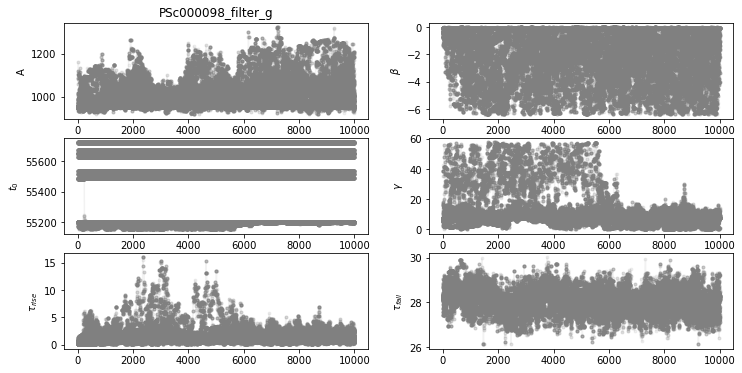

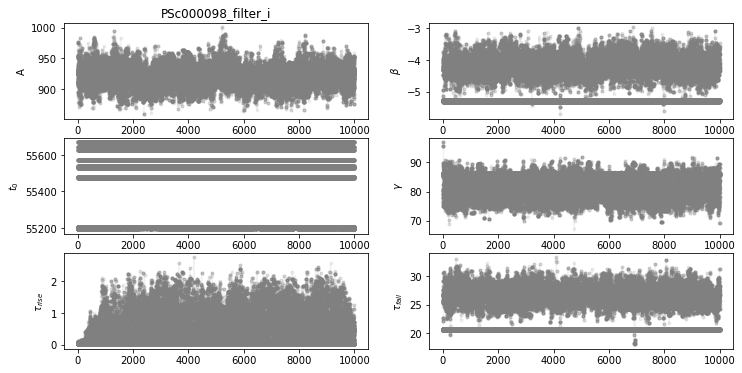

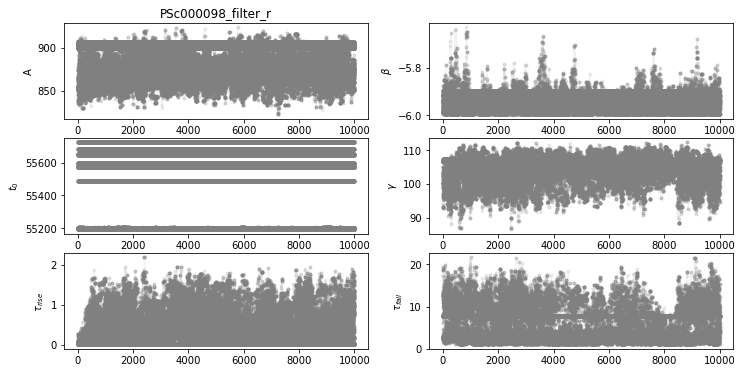

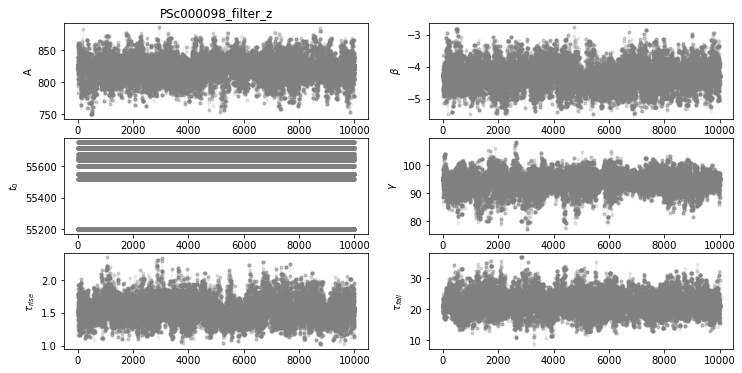

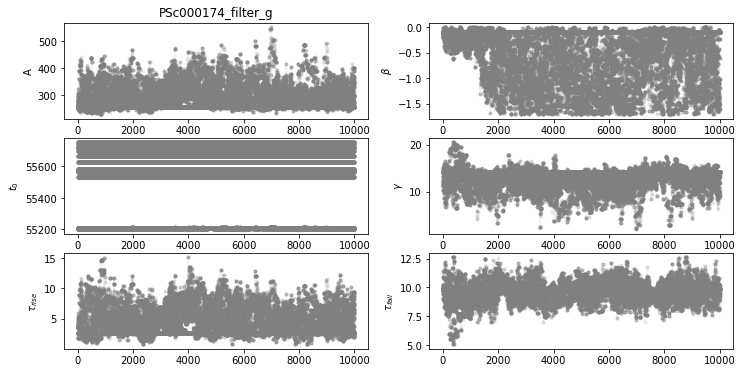

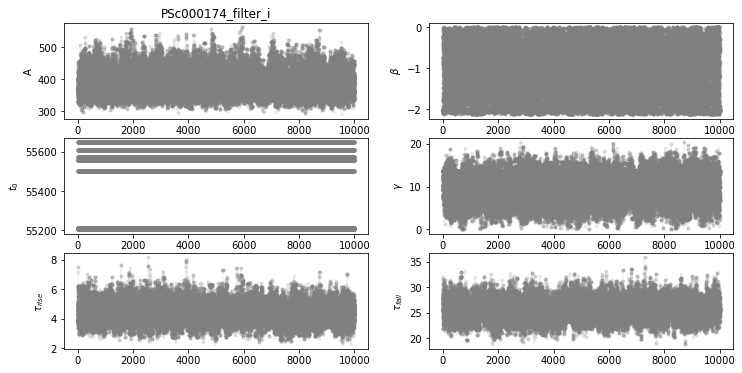

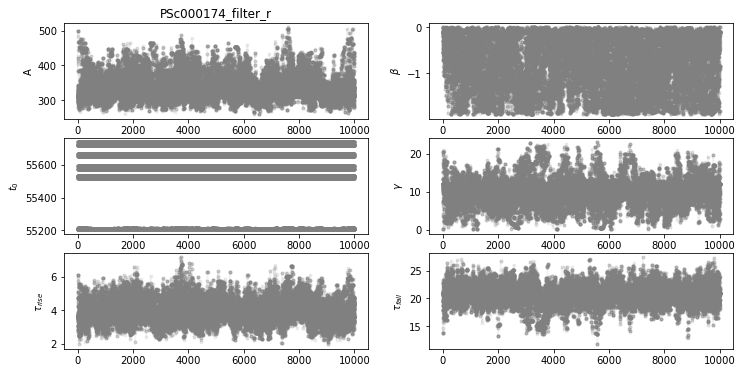

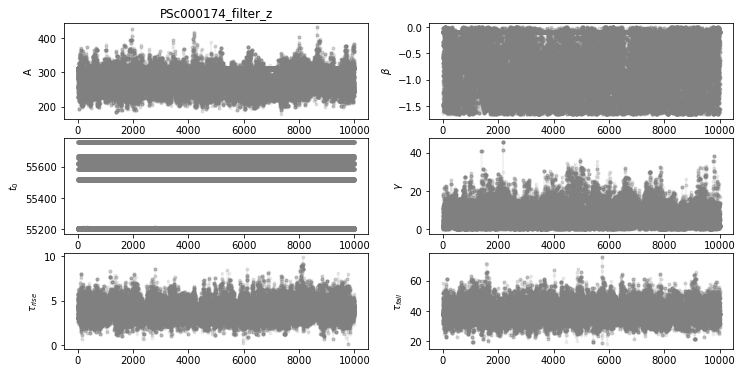

In [15]:
labels=['A', r'$\beta$', r'$t_0$', r'$\gamma$', r'$\tau_{rise}$', r'$\tau_{fall}$']
chain_files = ['PSc000098_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
chain_files += ['PSc000174_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
for load_chain in chain_files:
    samples = np.load(load_chain)
    fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12, 6))
    for i in range(samples.shape[-1]):
        j, k = np.unravel_index(i, (3, 2))
        ax = axs[j][k]
        [ax.plot(samples[walker,:,i],linestyle='-',color='grey',marker='.',alpha=0.1) for walker in range(20)]
        ax.set_ylabel(labels[i])
        if i == 0:
            ax.set_title(load_chain[:18])
    plt.show()

Unfortunately, a lot of these chains are messy, and some of the walkers are fixed around different local minima of the prior, but it's clear that there isn't any long lasting burn-in remaining. It seems like the 1000 steps we initially took was sufficient.

## Show that the posterior is reasonable by generating a corner plot with the corner package. 

PSc000098_filter_g


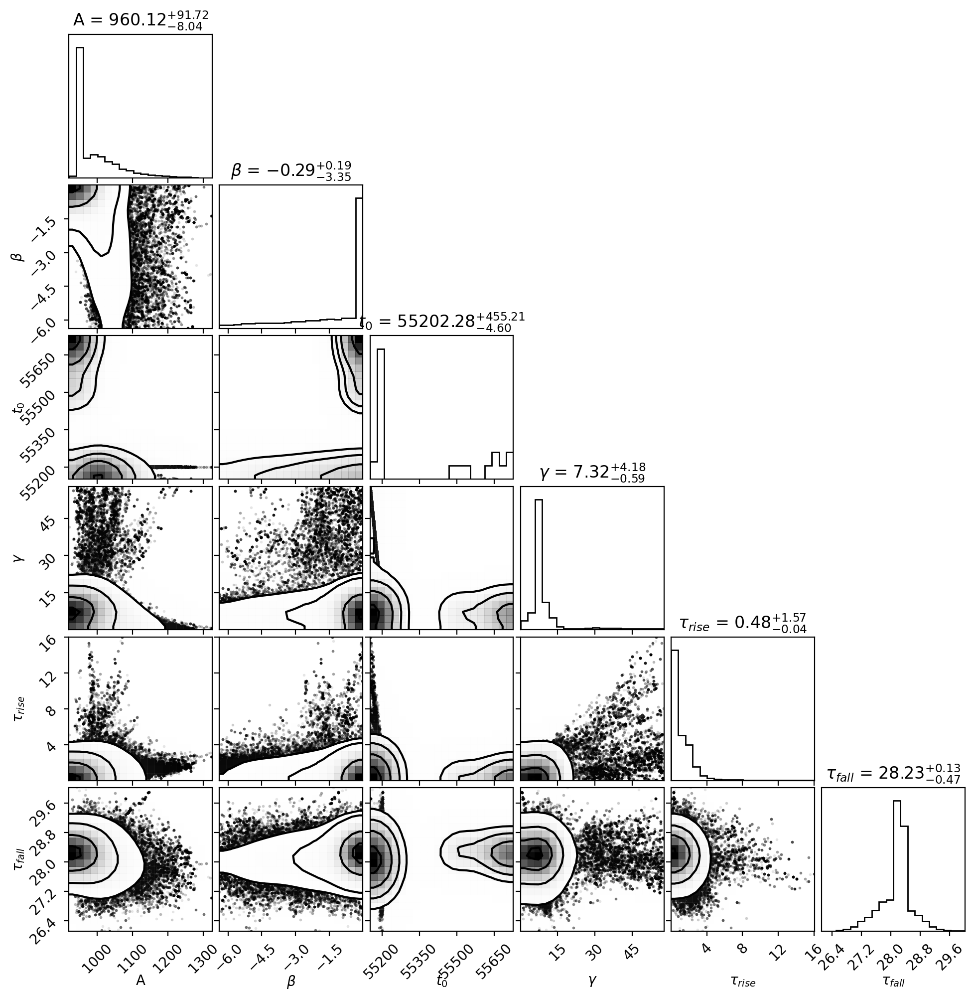

PSc000098_filter_i


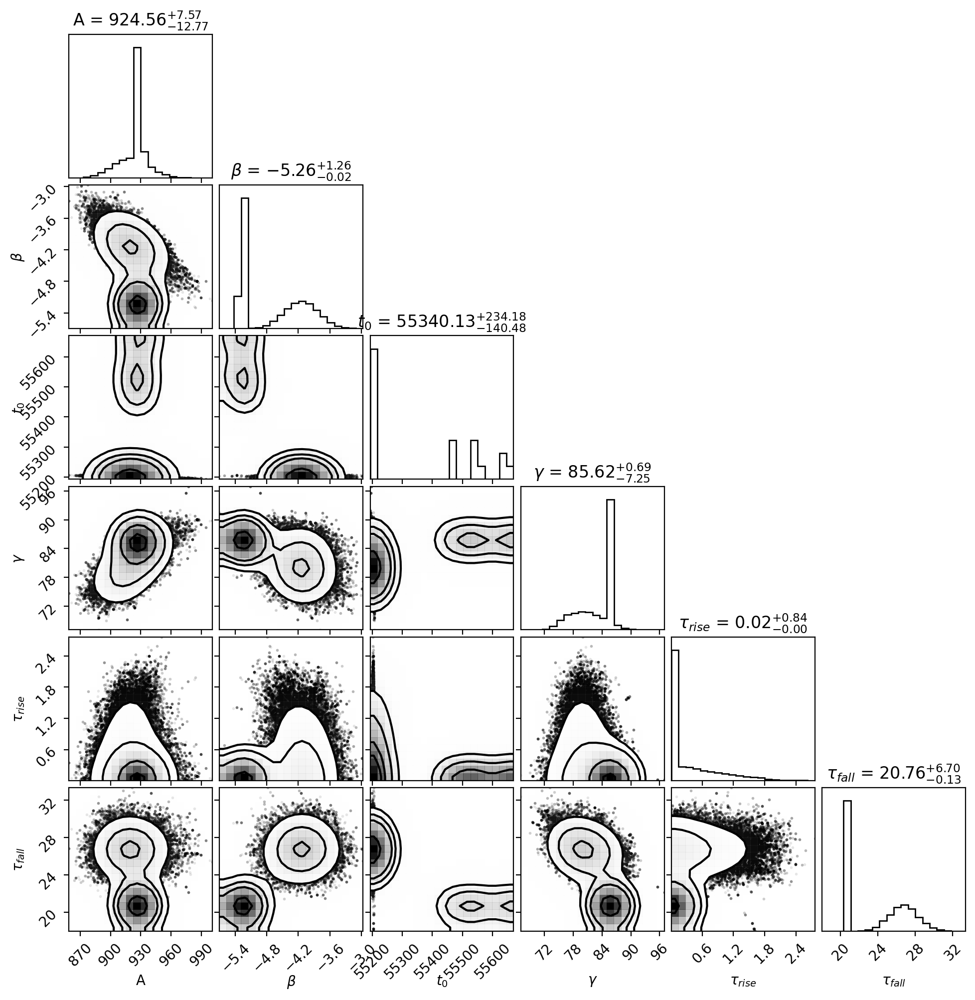

PSc000098_filter_r


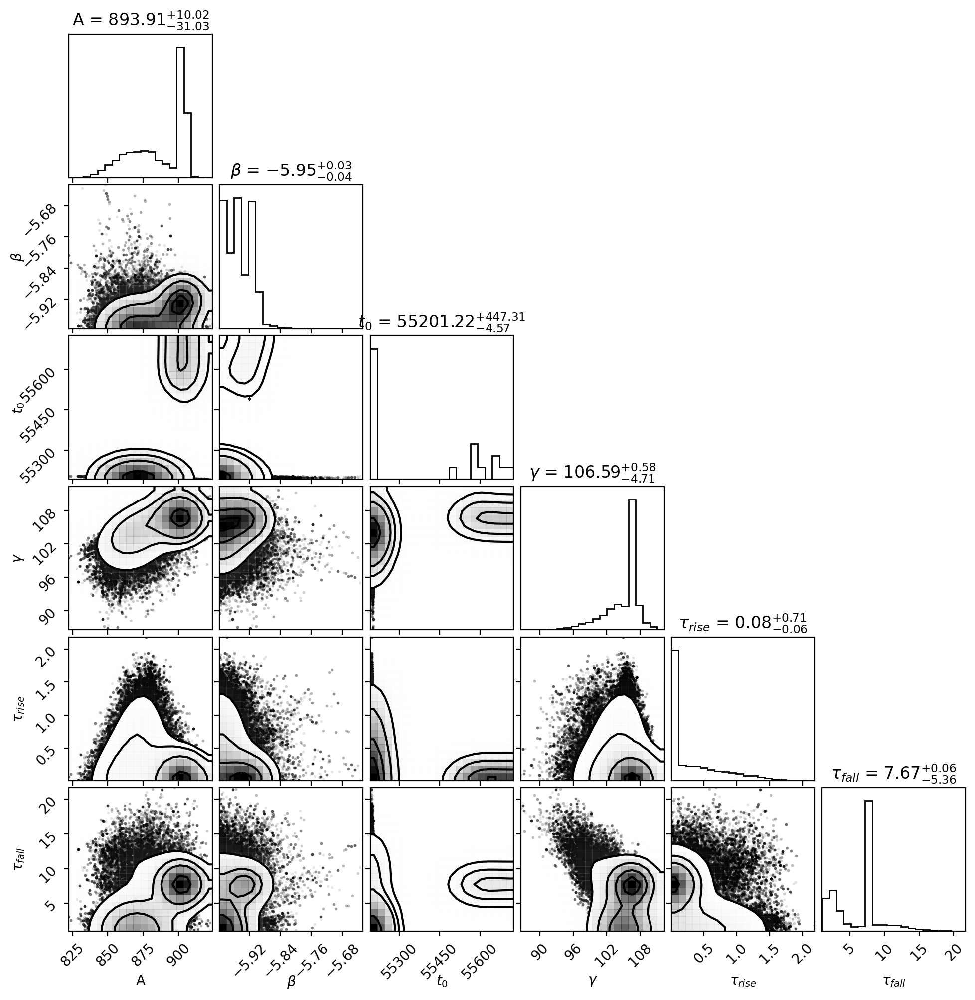

PSc000098_filter_z


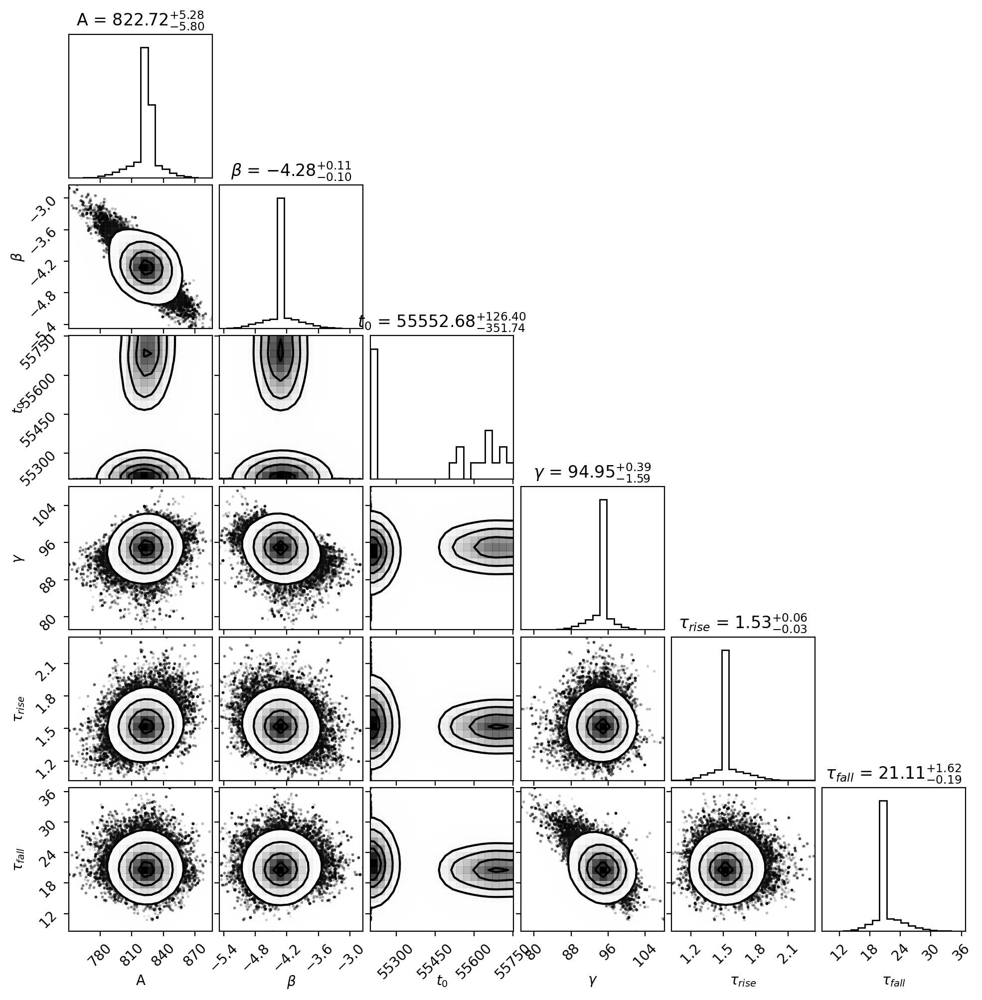

PSc000174_filter_g


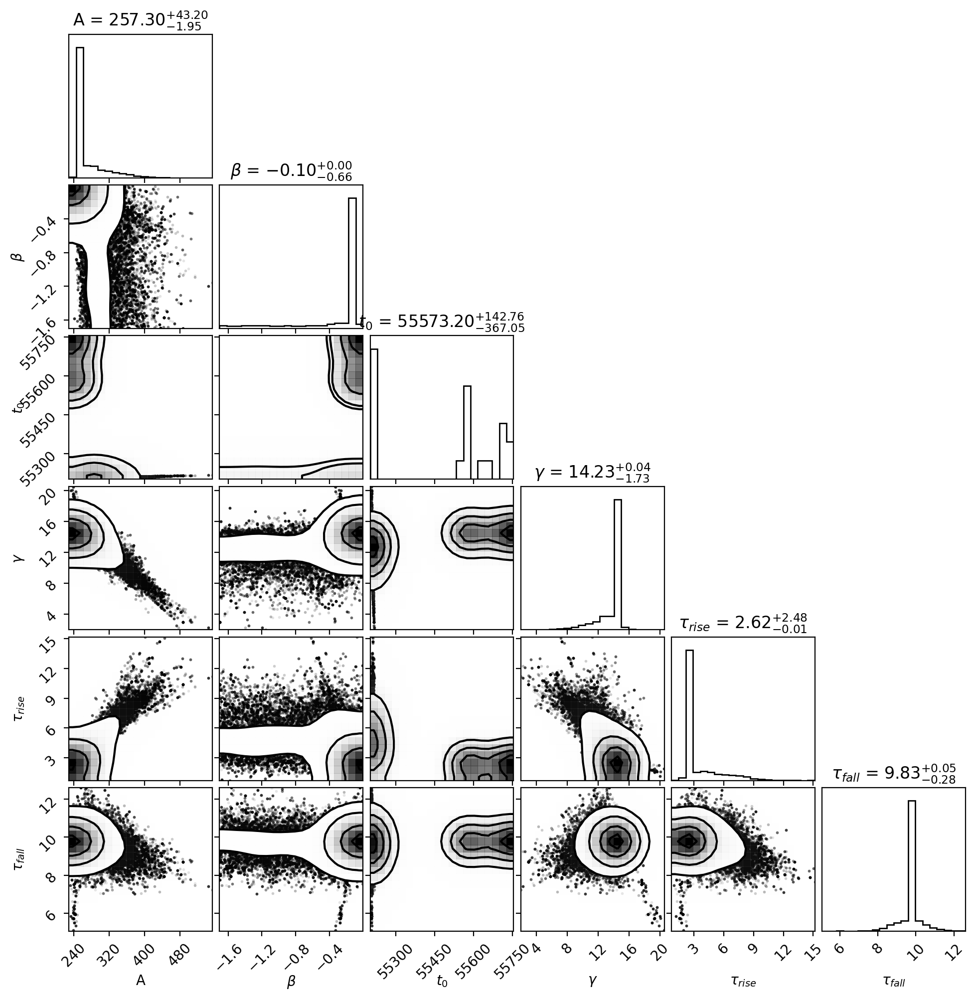

PSc000174_filter_i


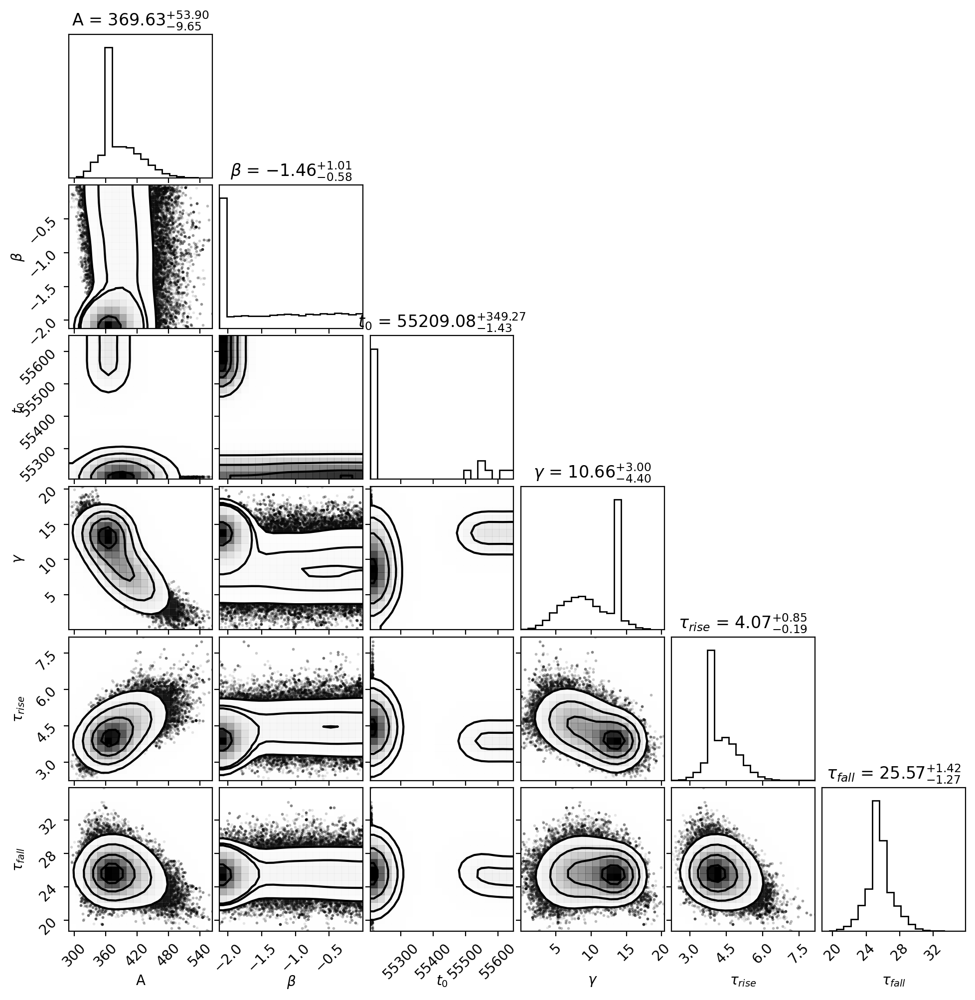

PSc000174_filter_r


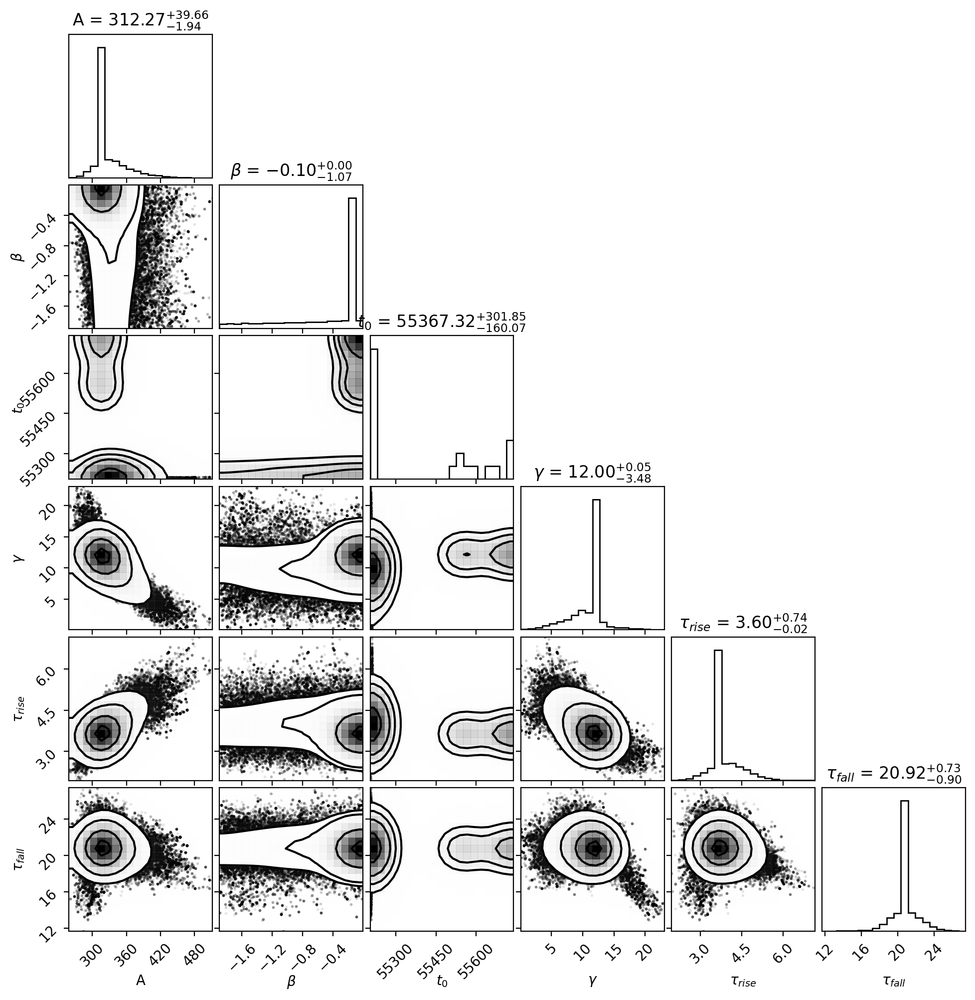

PSc000174_filter_z


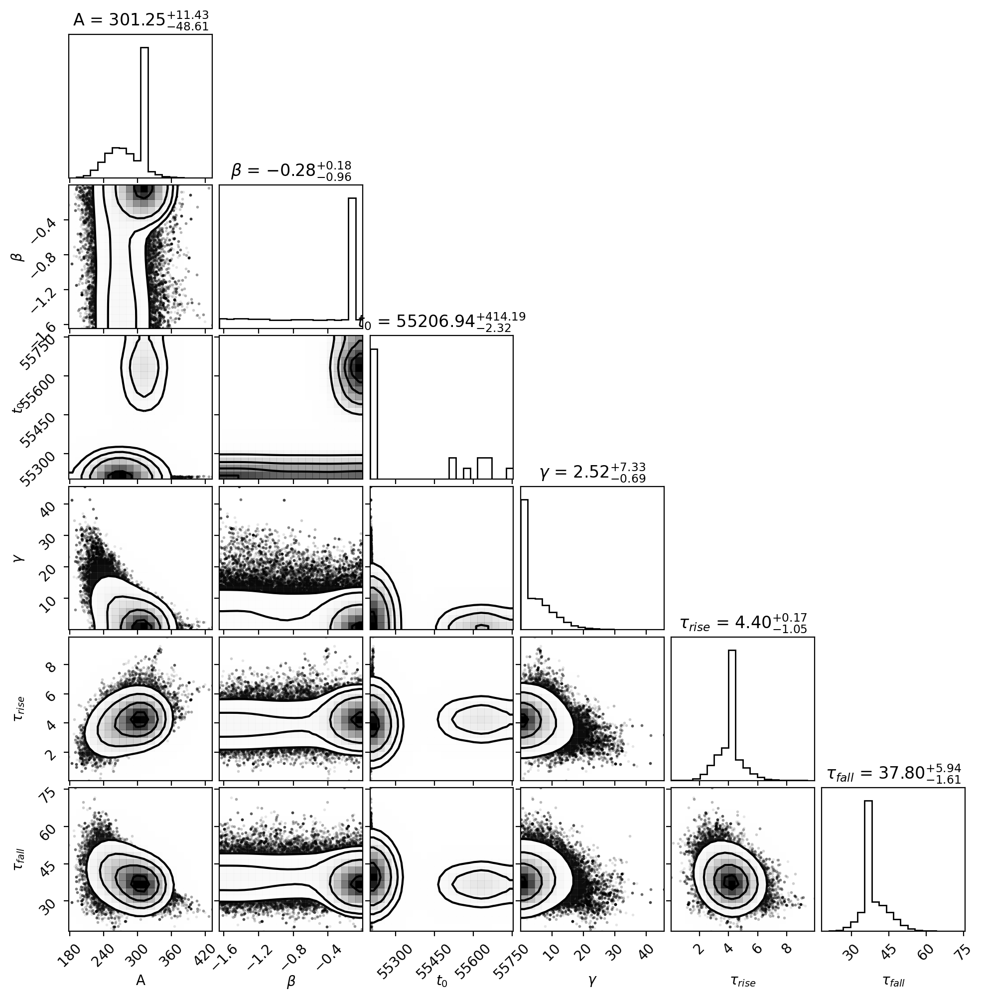

In [17]:
chain_files = ['PSc000098_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
chain_files += ['PSc000174_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
for load_chain in chain_files:
    load_chain_array = np.load(load_chain)
    print(load_chain[:18])
    fig = plt.figure(figsize=(10,10),dpi=200)
    labels=['A', r'$\beta$', r'$t_0$', r'$\gamma$', r'$\tau_{rise}$', r'$\tau_{fall}$']
    corner(load_chain_array[:,:,:].reshape((-1, ndims)),
                show_titles=True, smooth=2, fig=fig, labels=labels);
    plt.show()

A lot of the slices of these posteriors are pretty well behaved, but some are bimodal (or even multimodal), suggesting that a few of the walkers were getting stuck in local maxima of the posterior. Ultimately, we have higher uncertainty on our measurements than if they didn't get stuck in these maxima of the posterior, but the medians and modes of the  marginalizations for each parameter likely well-approximates the location of the global maximum of the posterior.

## Get the median estimate for each parameter, and recreate the plot above from Ashley. Note that she's made 5 random draws from the chain for each passband to give the reader a sense for the uncertainties. (25 pts)

In [20]:
chain_files = ['PSc000098_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
chain_files += ['PSc000174_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
for load_chain in chain_files:
    samples = np.load(load_chain)
    print(load_chain[:18], 'median parameter values:')
    reshape_samples = samples[:,:,:].reshape((samples.shape[0]*(samples.shape[1]), 6))
    median_params = np.median(reshape_samples,axis=0)
    print('\n')
    print('A_median = {:.3f}'.format(median_params[0]))
    print('beta_median = {:.3f}'.format(median_params[1]))
    print('t_0_median = {:.3f}'.format(median_params[2]))
    print('gamma_median = {:.3f}'.format(median_params[3]))
    print('tau_rise_median = {:.3f}'.format(median_params[4]))
    print('tau_fall_median = {:.3f}'.format(median_params[5]))
    print('\n\n')

PSc000098_filter_g median parameter values:


A_median = 960.117
beta_median = -0.288
t_0_median = 55202.275
gamma_median = 7.317
tau_rise_median = 0.480
tau_fall_median = 28.235



PSc000098_filter_i median parameter values:


A_median = 924.558
beta_median = -5.255
t_0_median = 55340.130
gamma_median = 85.618
tau_rise_median = 0.020
tau_fall_median = 20.761



PSc000098_filter_r median parameter values:


A_median = 893.909
beta_median = -5.946
t_0_median = 55201.222
gamma_median = 106.593
tau_rise_median = 0.077
tau_fall_median = 7.669



PSc000098_filter_z median parameter values:


A_median = 822.716
beta_median = -4.284
t_0_median = 55552.679
gamma_median = 94.954
tau_rise_median = 1.530
tau_fall_median = 21.106



PSc000174_filter_g median parameter values:


A_median = 257.302
beta_median = -0.101
t_0_median = 55573.196
gamma_median = 14.231
tau_rise_median = 2.620
tau_fall_median = 9.832



PSc000174_filter_i median parameter values:


A_median = 369.629
beta_median = -1.456
t

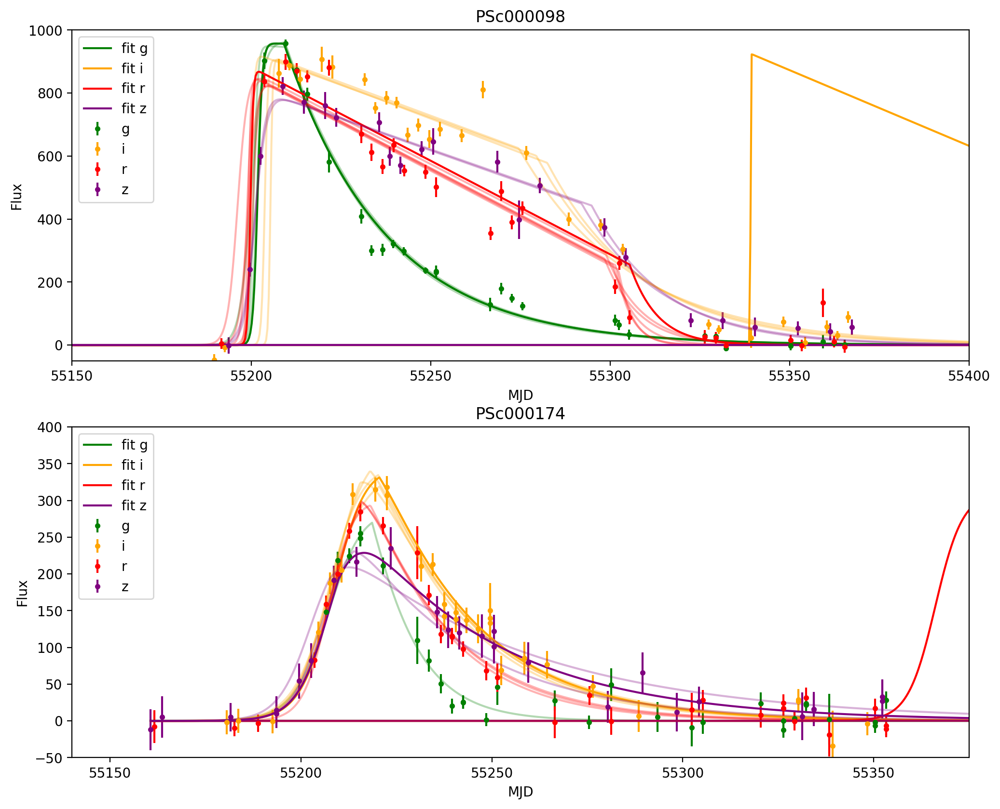

In [23]:
plt.figure(figsize=(12, 10), dpi=200)
xlims = [[55150, 55400],[55140, 55375]]
ylims = [[-50, 1000], [-50, 400]]
for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    plt.subplot(2,1,enum+1)
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    model_time_arr = np.linspace(np.min(t['MJD']), np.max(t['MJD']), 5000)
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                    yerr=current_model_err, label=filt, c=filt_colors[filt_enum])
            
            current_sigma = np.mean(current_model_err)
            current_Fmax = np.max(current_model_flux)
            current_tmin = np.min(current_model_time)
            current_tmax = np.max(current_model_time)
            
            
            optimize_time = np.linspace(np.min(t['MJD']), 
                           np.max(t['MJD']),
                           5000)
            
            samples = np.load(sn_lc[10:-10]+'_filter_'+filt+'_trial_10000_steps_v4.npy')
             
            
            plt.plot(optimize_time, flux(optimize_time, *np.median(samples[:,-1:,:], axis=0)[0]),
                     label='fit '+filt,
                    c=filt_colors[filt_enum])
            rng = np.random.default_rng()
            for i in rng.choice(20, size=5, replace=False):
                plt.plot(model_time_arr, flux(model_time_arr, *samples[i,-1:,:][0]),
                         c=filt_colors[filt_enum],alpha=0.3)
           
    plt.xlabel('MJD')
    plt.ylabel('Flux')
    plt.title(sn_lc[10:-10])
    plt.xlim(xlims[enum])
    plt.ylim(ylims[enum])
    plt.legend()
plt.show()

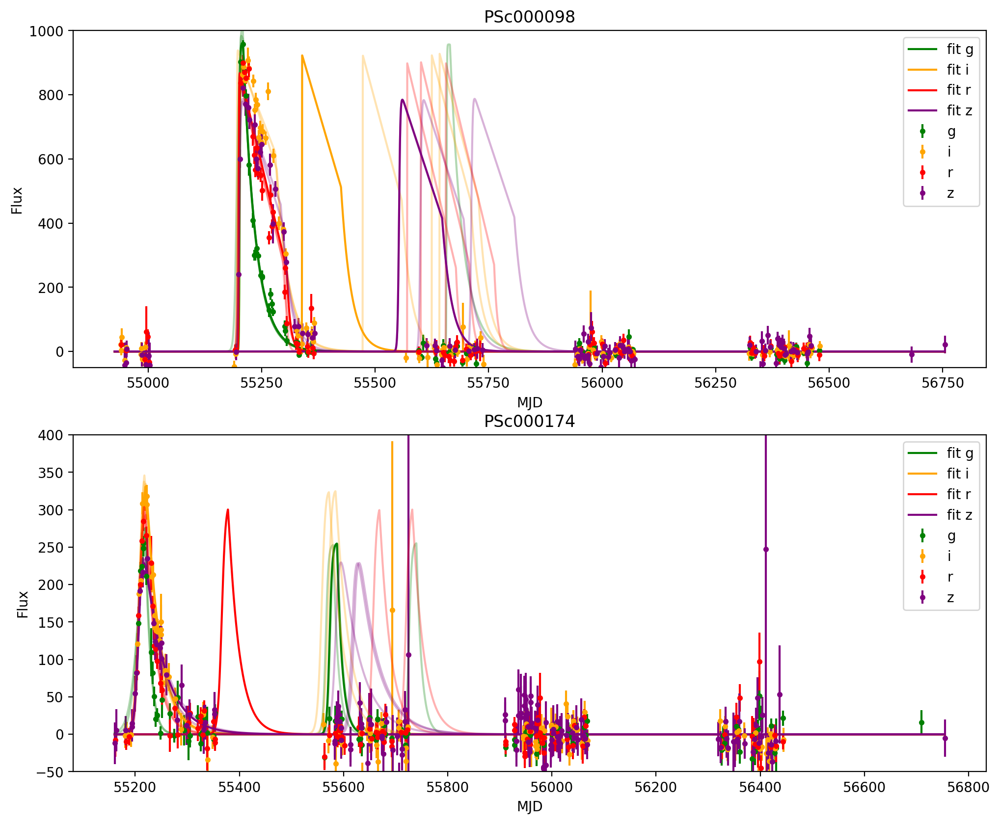

In [25]:
plt.figure(figsize=(12, 10), dpi=200)
xlims = [[55150, 55400],[55140, 55375]]
ylims = [[-50, 1000], [-50, 400]]
for enum, sn_lc in enumerate(['PS1_PS1MD_PSc000098.snana.dat','PS1_PS1MD_PSc000174.snana.dat']):
    plt.subplot(2,1,enum+1)
    t = Table.read(sn_lc,format='ascii.csv',comment='#',
                   names=['VARLIST:','MJD','FLT','FIELD','FLUXCAL','FLUXCALERR','MAG','MAGERR'],
                  data_start = 18,delimiter=' ')
    model_time_arr = np.linspace(np.min(t['MJD']), np.max(t['MJD']), 5000)
    for filt_enum, filt in enumerate(np.unique(t['FLT'])):
        # deal with the last row that is masked
        if np.ma.is_masked(filt) == False:
            filt_mask = np.where(t['FLT'] == filt)
            current_model_time = t['MJD'][filt_mask]
            current_model_flux = t['FLUXCAL'][filt_mask]
            current_model_err = t['FLUXCALERR'][filt_mask]
            plt.errorbar(x=current_model_time,y=current_model_flux,fmt='.',
                    yerr=current_model_err, label=filt, c=filt_colors[filt_enum])
            
            current_sigma = np.mean(current_model_err)
            current_Fmax = np.max(current_model_flux)
            current_tmin = np.min(current_model_time)
            current_tmax = np.max(current_model_time)
            
            
            optimize_time = np.linspace(np.min(t['MJD']), 
                           np.max(t['MJD']),
                           5000)
            
            samples = np.load(sn_lc[10:-10]+'_filter_'+filt+'_trial_10000_steps_v4.npy')
             
            
            plt.plot(optimize_time, flux(optimize_time, *np.median(samples[:,-1:,:], axis=0)[0]),
                     label='fit '+filt,
                    c=filt_colors[filt_enum])
            rng = np.random.default_rng()
            for i in rng.choice(20, size=5, replace=False):
                plt.plot(model_time_arr, flux(model_time_arr, *samples[i,-1:,:][0]),
                         c=filt_colors[filt_enum],alpha=0.3)
           
    plt.xlabel('MJD')
    plt.ylabel('Flux')
    plt.title(sn_lc[10:-10])
    plt.ylim(ylims[enum])
    plt.legend()
plt.show()

I plot the median fit in a darker shade and 5 random draws from the final state of the walkers in the lighter shades. 

## PSc000098:
g band is has pretty low uncertainty. The random draws are all quite close to the median parameters, and they all characterize the light curve well. r-band has slightly higher uncertainty, but all of the draws have the same characeristic long plateau shape. In the cases of i and z band, many of the random draws characterize the light curve well, but the median parameters do not. In these cases the median models are offset from the peak in time, though they do have the right shape.

## PSc000174:
Likewise in this SNe, all of the median models and draws have the right shape, but some of them have completely inaccurate $t_0$. 

I'm not sure how these inaccurate $t_0$s occured since I defined my prior on $t_0$ to be

\begin{equation}
P(t_0) = \begin{cases}
N(t_{0, scipy fit}, 25) & \text{ if }t_{0, scipy fit} + 50{ > t_0 > }t_{0, scipy fit} - 50 \\
0 & \text{ otherwise}
\end{cases}
\end{equation}

but many of these models have $t_0$ much higher than the limits of where the prior is non-zero. This is a bug that I would address if I had more time and computational power to rerun these chains.

## Report the auto-correlation length of your chain. Thin it by a factor of 10 and report the auto-correlation length again. (15 pts)

In [26]:
def B(chain):
    n = chain.shape[1]
    m = chain.shape[0]
    theta_j = np.mean(chain,axis=1)
    theta_best = np.mean(theta_j, axis=0)
    return (n/(m-1)) * np.sum((theta_j - theta_best)**2, axis=0)
def W(chain):
    m = chain.shape[0]
    return 1./m * np.sum(np.var(chain, axis=1), axis=0)
def V(chain):
    n = chain.shape[1]
    return (n-1)/n * W(chain) + 1/n * B(chain)
def R(chain):
    return np.sqrt(V(chain)/W(chain))

def neff(chain, t_final):
    n = chain.shape[1]
    m = chain.shape[0]
    sum_rho = np.sum([rho_t(chain, t) for t in np.arange(0, t_final)])
    return m*n/(1. + 2 * sum_rho)
def rho_t(chain, t):
    return 1 - 0.5*(V_t(chain, t)/V(chain))
def V_t(chain, t):
    n = chain.shape[1]
    m = chain.shape[0]
    if t == 0:
    # there is no lag, so, = 0
        V_t_arr = np.zeros_like(chain[0, 0, :])
    else:
        V_t_arr = np.sum(np.sum(((chain[t:m+1] - chain[1:m-t+1])**2), axis=1), axis=0) 
    return V_t_arr/(m*(n-t))

In [85]:
# This is wrong. This is actually the number of effective samples
# chain_files = ['PSc000098_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
# chain_files += ['PSc000174_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
# for load_chain in chain_files:
#     samples = np.load(load_chain)
#     print(load_chain[:18], ':')
#     print('autocorrelation time before thinning: {:.3f}'.format(neff(samples[:,:,:], 22)))
#     print('autocorrelation time after thinning by a factor 10: {:.3f}'.format(neff(samples[:,::10,:], 22)))
#     print('\n\n')

In [46]:
from pandas.plotting import autocorrelation_plot

PSc000098_filter_g :


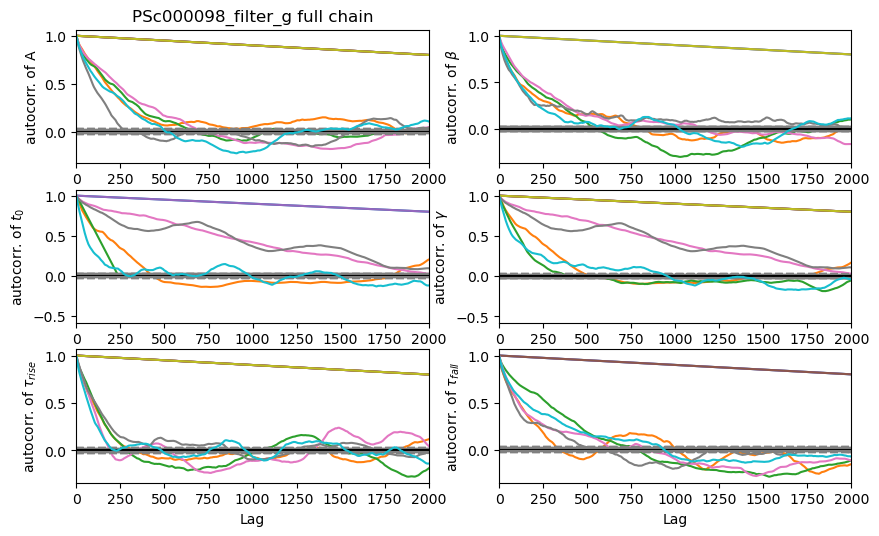

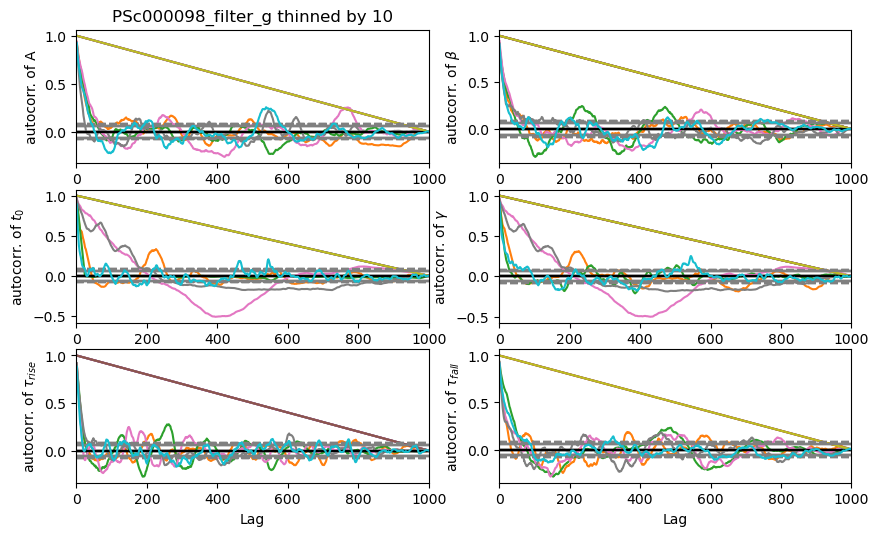

PSc000098_filter_i :


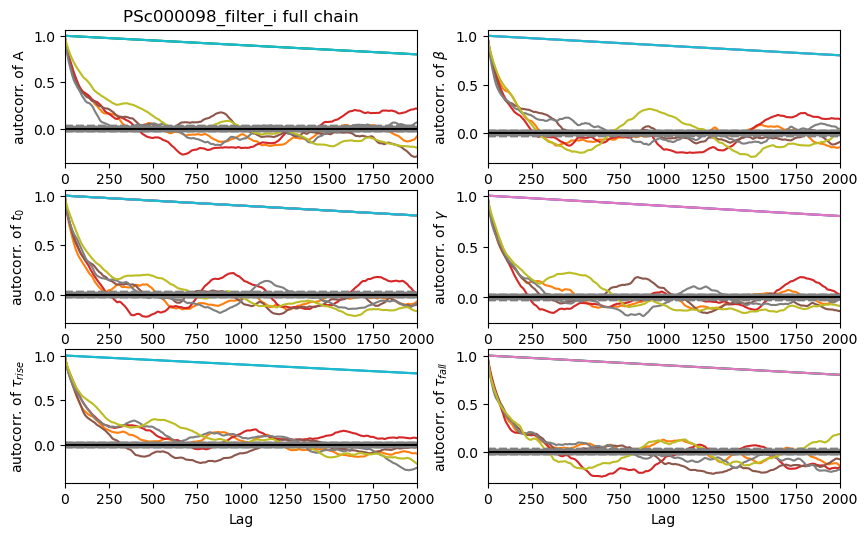

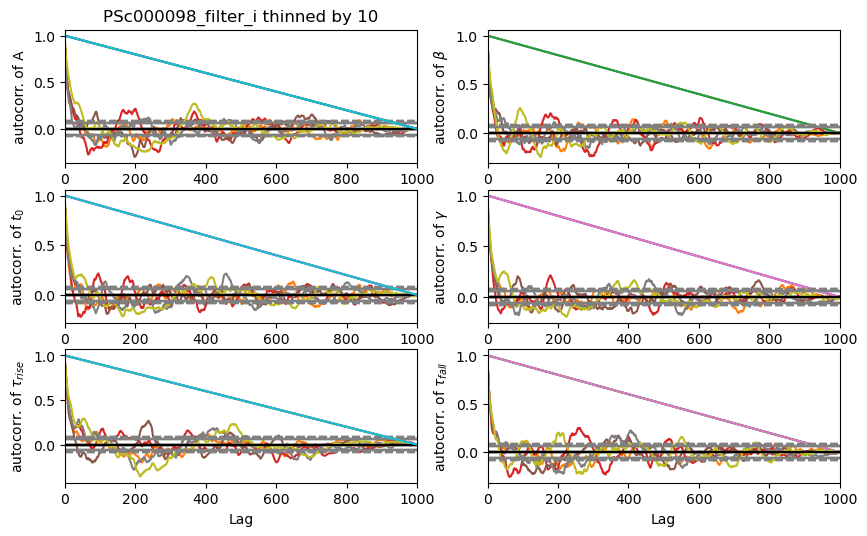

PSc000098_filter_r :


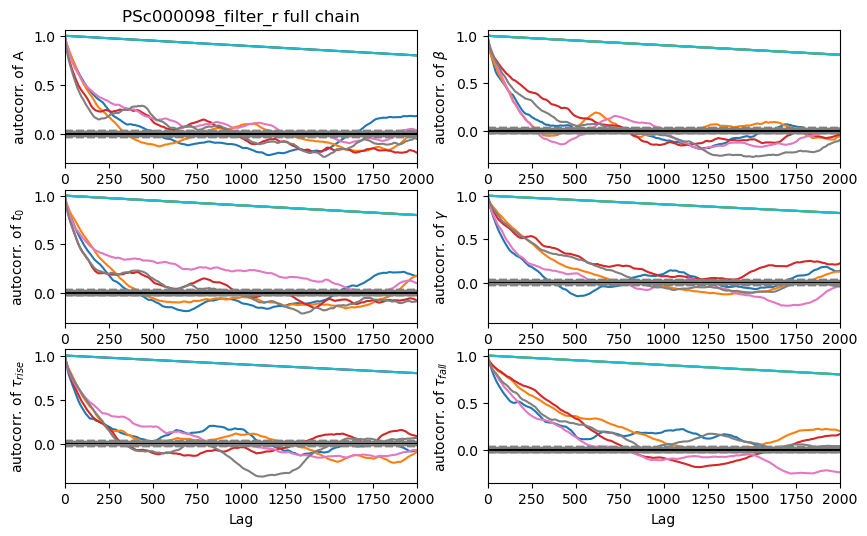

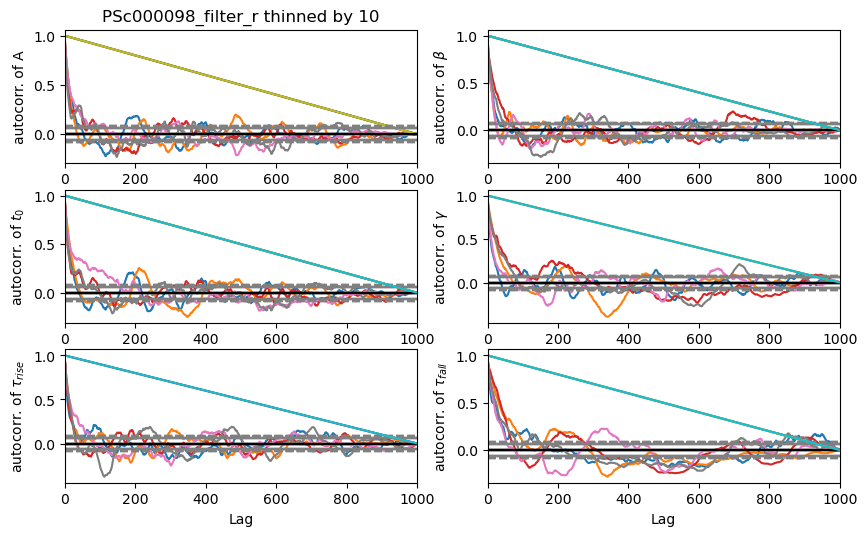

PSc000098_filter_z :


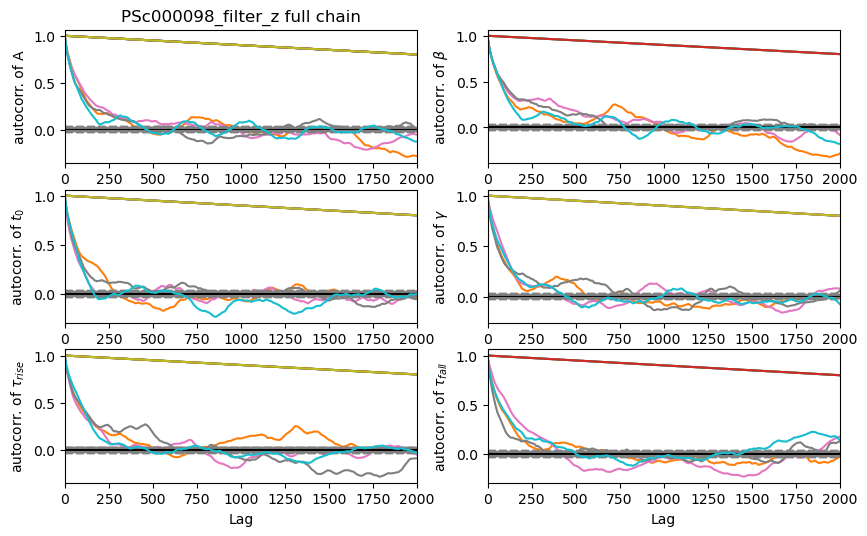

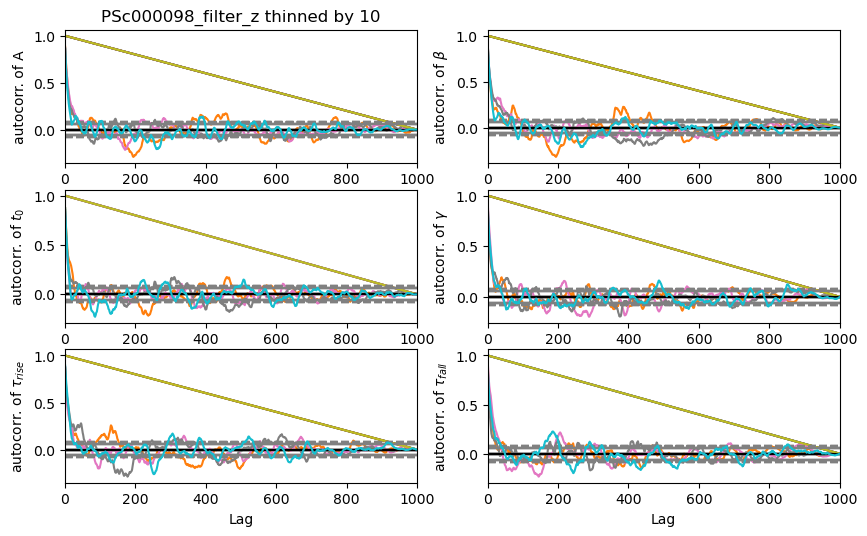

PSc000174_filter_g :


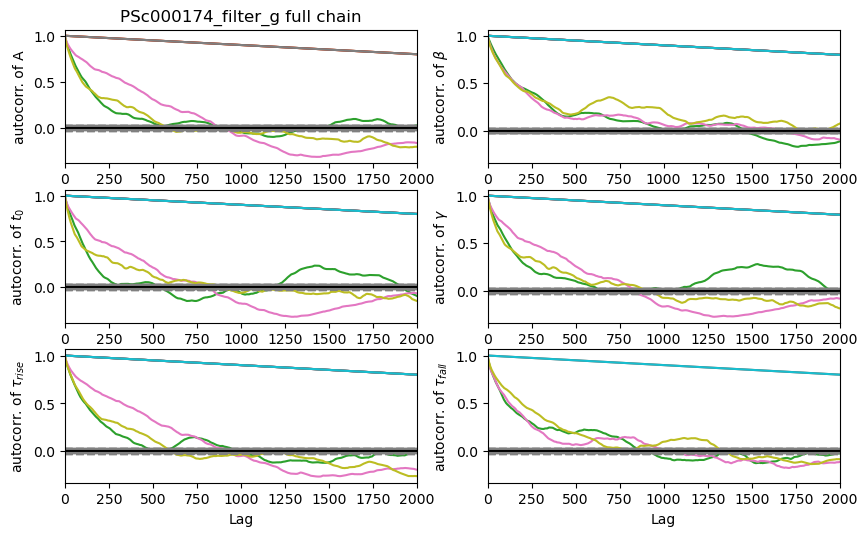

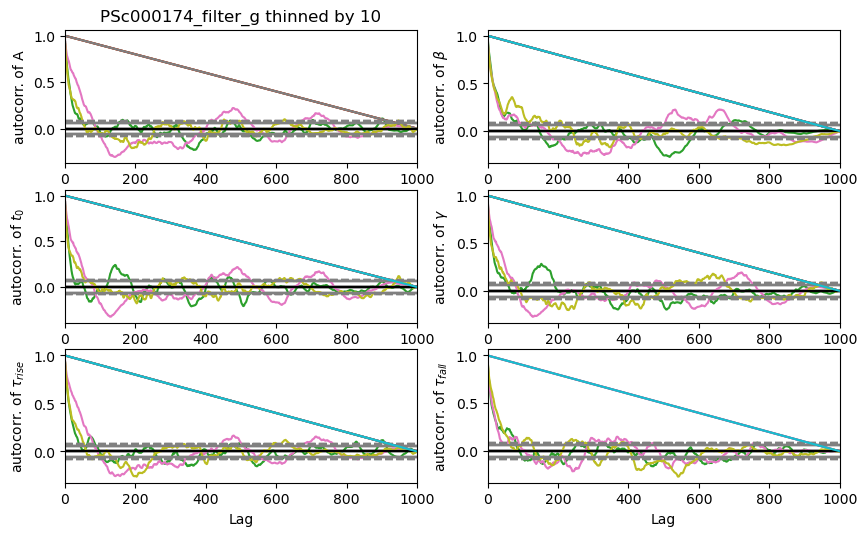

PSc000174_filter_i :


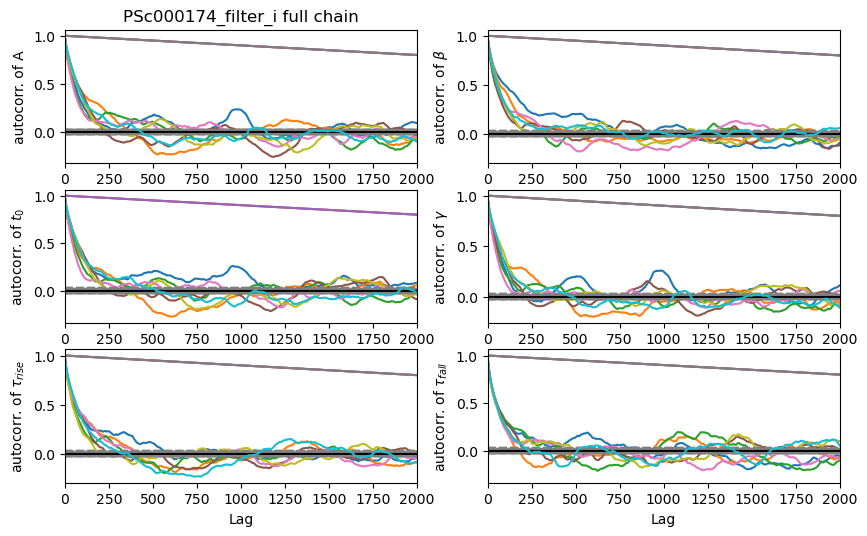

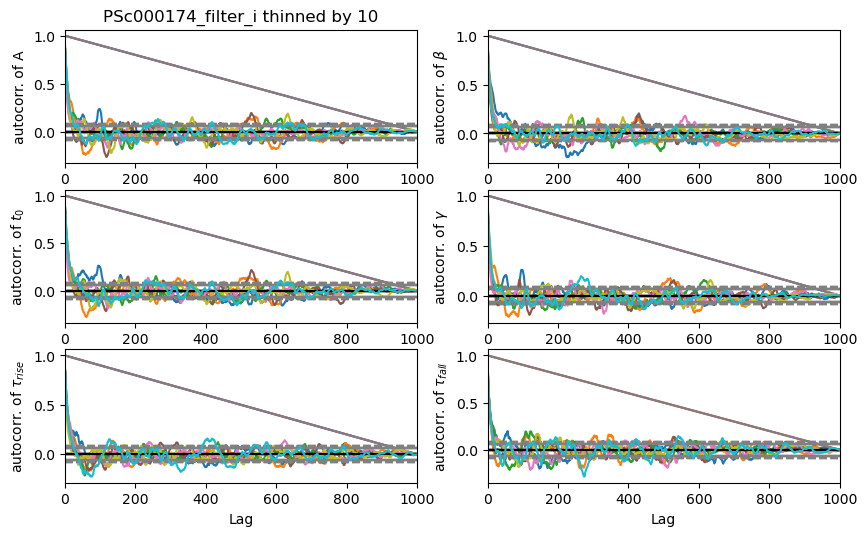

PSc000174_filter_r :


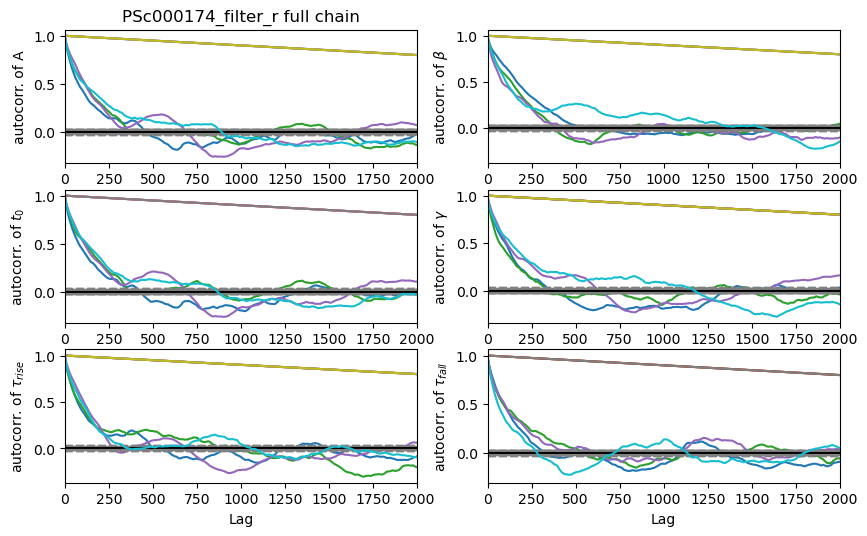

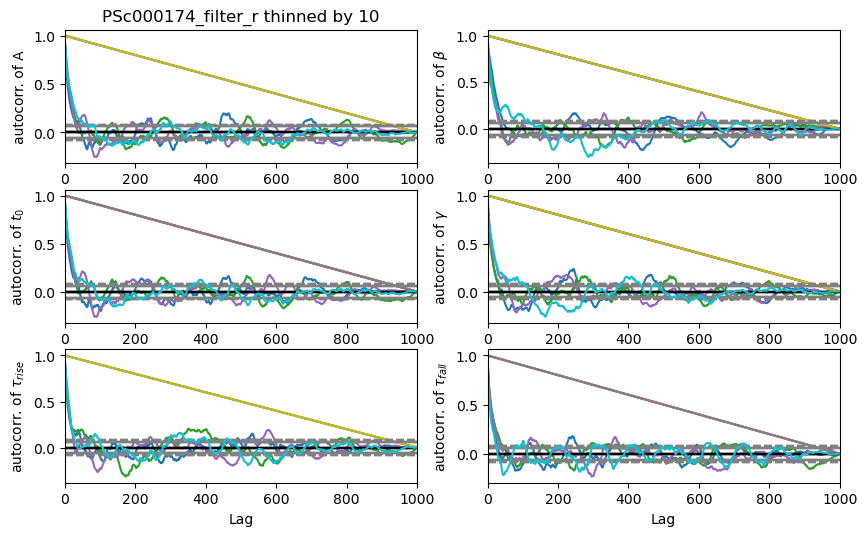

PSc000174_filter_z :


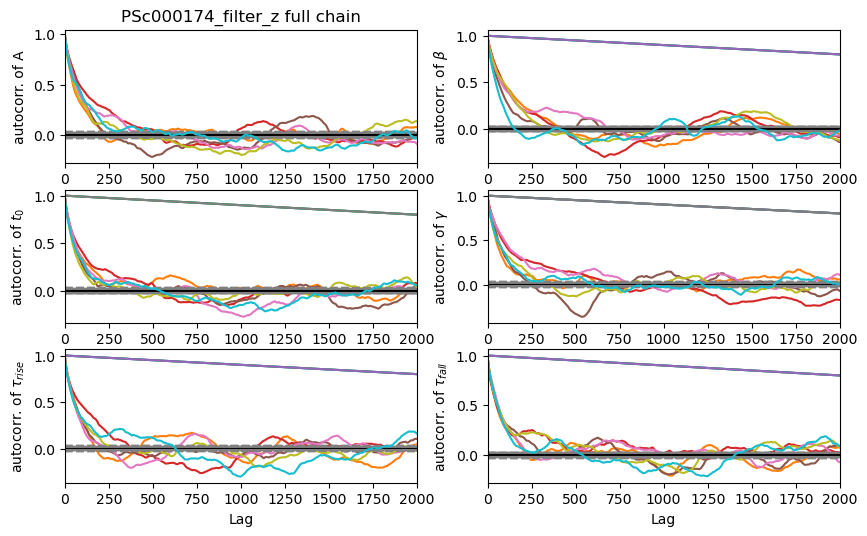

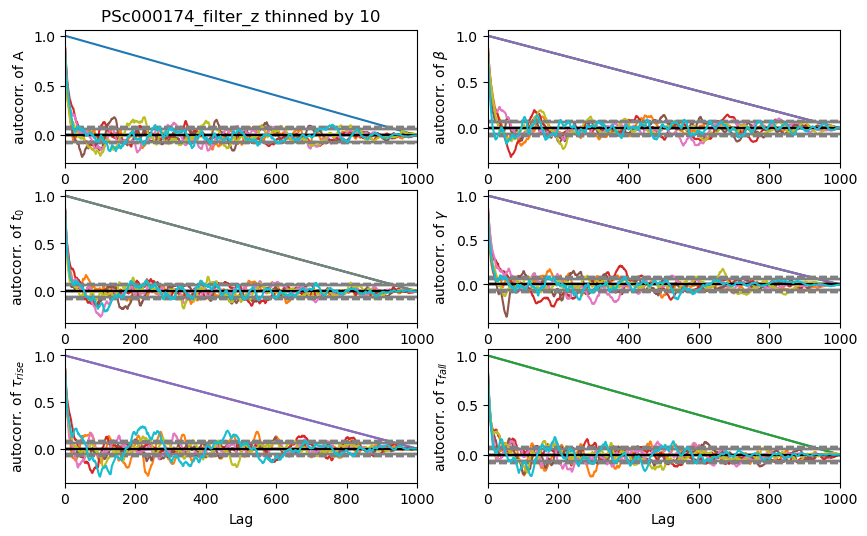

In [87]:
chain_files = ['PSc000098_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
chain_files += ['PSc000174_filter_'+filt_name+'_trial_10000_steps_v4.npy' for filt_name in ['g', 'i', 'r', 'z']]
for load_chain in chain_files:
    samples = np.load(load_chain)
    print(load_chain[:18], ':')


    fig = plt.figure(figsize=(10,6),dpi=100)
    for enum in range(6):
        ax = plt.subplot(3,2,enum+1)
        for walker in range(0, 20, 2):
            autocorrelation_plot(samples[walker,:,enum], ax=ax)
        ax.set_ylabel('autocorr. of '+labels[enum])
        ax.set_xlim(0, 2000)
        if enum == 0:
            ax.set_title(load_chain[:18]+' full chain')
    plt.show()
    
    fig = plt.figure(figsize=(10,6),dpi=100)
    for enum in range(6):
        ax = plt.subplot(3,2,enum+1)
        for walker in range(0, 20, 2):
            autocorrelation_plot(samples[walker,::10,enum], ax=ax)
        ax.set_ylabel('autocorr. of '+labels[enum])
        ax.set_xlim(0, 1000)
        if enum == 0:
            ax.set_title(load_chain[:18]+' thinned by 10')
    plt.show()


For each band, I'm showing a zoomed in version of the autocorrelation of each parameter for a subset of the walkers. I can't do the flattened chain because the plotting just takes too long for my computer, but also as previously discussed, some of the walkers are trapped in local minima. We'll call the autocorrelation time the time it takes for a walker to cross autocorrelation = 0, i.e. the time after which steps become uncorrelated. Some of the parameters take longer to get there than others, and there is some variance between bands, but in general, the well-behaved walkers have autocorrelation times between 250 and 750 steps. After thinning by 10, the autocorrelation time goes down drastically. It can range from $\sim 50$ to $\sim 100$, though it generally leans to the lower side of this range.

# Final test, not super well justified:
Because of the issues with offsets in $t_0$, I decided to run emcee but impose a mask on the data for MJD > 55500. I chose this because both supernovae occur at MJD less than this, and at t $\sim$ 55500 MJD, both data have a chunk of time with no data, and then flat curves which are pretty noisy. This is pretty easily implemented, I just add a line of code

```
time_mask = current_model_time < 55500.
```

and then modify my ensemble sampler to be 

```
sampler = emcee.EnsembleSampler(nwalkers, ndims, log_posterior,
                                                   args=(current_model_time[time_mask],
                                                        current_model_flux[time_mask],
                                                        current_model_err[time_mask],
                                                        t_0_prior_val),
                                                   pool=pool)
```

Unfortunately, I only had the time to run 5000 steps after 1000 burn-in, but from the few bands that I was able to run this modified code on, I still ran into the same bimodal posterior of $t_0$ that I faced when running on the entire time series. 